# Exploring Ceramic Glazes Using Unsupervised Clustering
By Mitch Shiles 
### Introduction
Ceramics as a field encompasses a broad range of physical materials that can be as specialized as superconducting magnets or as ubiquitous as common floor tile. Ceramic materials are often high dimensional in regards to the chemistry and formation conditions. This has led many Ceramic Material Science programs to adopt recent machine learning techniques to help select materials for testing and implementation. In this notebook, ceramic glazes will be investigated with clustering techniques.

Ceramic glazes are glass-like coatings that are applied to ceramic wares in the form of a water suspended mixture of powdered materials. The coatings are then brought to a molten state in a kiln, where they fuse to the ceramic. Most glazes are composed primarily of silica and alumina, they also contain a large variety of metal oxides that are used to modify things like melting temperature, opacity, color, and surface type.  As with any ceramic material they vary with a high level of dimensionality in regards to chemical composition, ratios of metal oxides, particulate shape, particulate size, hydration, coefficients of expansion, and firing process(heating process).
     
Ceramic glazes are frequently employed by potters, artists, designers, and architects and are often formulated and altered by individuals in these fields with little or no knowledge of ceramic chemistry. This is both a boon and a burden to the industry in that there is a high-level of variation and experimentation with glaze surfaces, yet often these formulations are mislabeled, mischaracterized, and in some cases can result in dangerous conditions for food surfaces or architectural ornament.
   In this notebook, unsupervised clustering techniques will be applied to glazes using data about their physical characteristics and chemistry. A dataset that originated from the website glazy.org is analyzed and examined using dimensionality reduction. Glazy.org is a community-based website where anyone can upload glaze recipes to share and they are publicly available. Glazy then takes the ingredients used in the recipe and forms its chemical composition.  The data set consists of 330 variables such as names, physical descriptions of surface and opacity, firing temperatures, and a detailed list of ceramic oxides present by percentage, UMF (Unity Molecular Formula), and moles.
   
- Data set 
https://www.kaggle.com/pietermostert/glazy-data-june-2019

- Glazy.org
https://glazy.org/

- References
https://ceramicartsnetwork.org/daily/ceramic-glaze-recipes/glaze-chemistry/makes-matte-glaze-matte/

In [188]:
from IPython.display import Image
Image(url= "https://s3-us-west-2.amazonaws.com/reference/images/glossary/nenbuninux.jpg")

The above image is of a stull chart which plots glazes by their UMF of silica and alumina and classifies them into unfused mattes, semimattes, bright, and devitrified glazes. 

 The UMF refers to the Unity Molecular Formula, which is composed of oxide ratios for various elements in the glaze. In the UMF, the sum of the fluxing oxides RO and R2O are equal to one and all other oxides are adjusted to match. The UMF is useful because the ratios of certain oxides can be used to predict things like firing temperature, surface gloss, and durability.

In [2536]:
Image(url= "http://www.castlehs.com/users/ccozart/images/ConeInKiln.jpg")


Image of pyrometric cones softening in a hot kiln

Firing Temperature for glazes is often measured by pyrometric cone, cones that melt when they have reached a certain temperature. the cone system is a logatithmic unit of measurment most artists dont go above cone 14 (1351°C)as it would require a special kiln. To simplify temperature Artists typically break these cones into groups high fire(cones greater than 8) Mid range(between cones 1 and 8) and low fire(below cone 01).
   

In [2547]:

import numpy as np
import pandas as pd 


import matplotlib.pyplot as plt
import matplotlib.colors
import seaborn as sns

import scipy.stats as stats
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn import datasets, metrics
import umap

import os
import warnings 

pd.set_option('display.max_rows',1000)
pd.set_option('display.max_columns',500)
pd.set_option('display.width',1000)

warnings.filterwarnings('ignore')



In [2548]:
#import Glazy Dataset 
glaze_df = pd.read_csv('/Users/robertshiles/CSV_files/glazy_data_june_2019.csv')
glaze_df.head(5)


,id,name,created_by_user_id,material_type_id,material_type,material_state_id,material_state,rgb_r,rgb_g,rgb_b,surface_type,transparency_type,from_orton_cone,to_orton_cone,is_analysis,is_primitive,is_theoretical,is_private,SiO2_percent,Al2O3_percent,B2O3_percent,Li2O_percent,K2O_percent,Na2O_percent,KNaO_percent,BeO_percent,MgO_percent,CaO_percent,SrO_percent,BaO_percent,ZnO_percent,PbO_percent,P2O5_percent,F_percent,V2O5_percent,Cr2O3_percent,MnO_percent,MnO2_percent,FeO_percent,Fe2O3_percent,CoO_percent,NiO_percent,CuO_percent,Cu2O_percent,CdO_percent,TiO2_percent,ZrO_percent,ZrO2_percent,SnO2_percent,HfO2_percent,Nb2O5_percent,Ta2O5_percent,MoO3_percent,WO3_percent,OsO2_percent,IrO2_percent,PtO2_percent,Ag2O_percent,Au2O3_percent,GeO2_percent,As2O3_percent,Sb2O3_percent,Bi2O3_percent,SeO2_percent,La2O3_percent,CeO2_percent,PrO2_percent,Pr2O3_percent,Nd2O3_percent,U3O8_percent,Sm2O3_percent,Eu2O3_percent,Tb2O3_percent,Dy2O3_percent,Ho2O3_percent,Er2O3_percent,Tm2O3_percent,Yb2O3_percent,Lu2O3_percent,SiO2_umf,Al2O3_umf,B2O3_umf,Li2O_umf,K2O_umf,Na2O_umf,KNaO_umf,BeO_umf,MgO_umf,CaO_umf,SrO_umf,BaO_umf,ZnO_umf,PbO_umf,P2O5_umf,F_umf,V2O5_umf,Cr2O3_umf,MnO_umf,MnO2_umf,FeO_umf,Fe2O3_umf,CoO_umf,NiO_umf,CuO_umf,Cu2O_umf,CdO_umf,TiO2_umf,ZrO_umf,ZrO2_umf,SnO2_umf,HfO2_umf,Nb2O5_umf,Ta2O5_umf,MoO3_umf,WO3_umf,OsO2_umf,IrO2_umf,PtO2_umf,Ag2O_umf,Au2O3_umf,GeO2_umf,As2O3_umf,Sb2O3_umf,Bi2O3_umf,SeO2_umf,La2O3_umf,CeO2_umf,PrO2_umf,Pr2O3_umf,Nd2O3_umf,U3O8_umf,Sm2O3_umf,Eu2O3_umf,Tb2O3_umf,Dy2O3_umf,Ho2O3_umf,Er2O3_umf,Tm2O3_umf,Yb2O3_umf,Lu2O3_umf,SiO2_xumf,Al2O3_xumf,B2O3_xumf,Li2O_xumf,K2O_xumf,Na2O_xumf,KNaO_xumf,BeO_xumf,MgO_xumf,CaO_xumf,SrO_xumf,BaO_xumf,ZnO_xumf,PbO_xumf,P2O5_xumf,F_xumf,V2O5_xumf,Cr2O3_xumf,MnO_xumf,MnO2_xumf,FeO_xumf,Fe2O3_xumf,CoO_xumf,NiO_xumf,CuO_xumf,Cu2O_xumf,CdO_xumf,TiO2_xumf,ZrO_xumf,ZrO2_xumf,SnO2_xumf,HfO2_xumf,Nb2O5_xumf,Ta2O5_xumf,MoO3_xumf,WO3_xumf,OsO2_xumf,IrO2_xumf,PtO2_xumf,Ag2O_xumf,Au2O3_xumf,GeO2_xumf,As2O3_xumf,Sb2O3_xumf,Bi2O3_xumf,SeO2_xumf,La2O3_xumf,CeO2_xumf,PrO2_xumf,Pr2O3_xumf,Nd2O3_xumf,U3O8_xumf,Sm2O3_xumf,Eu2O3_xumf,Tb2O3_xumf,Dy2O3_xumf,Ho2O3_xumf,Er2O3_xumf,Tm2O3_xumf,Yb2O3_xumf,Lu2O3_xumf,SiO2_mol,Al2O3_mol,B2O3_mol,Li2O_mol,K2O_mol,Na2O_mol,KNaO_mol,BeO_mol,MgO_mol,CaO_mol,SrO_mol,BaO_mol,ZnO_mol,PbO_mol,P2O5_mol,F_mol,V2O5_mol,Cr2O3_mol,MnO_mol,MnO2_mol,FeO_mol,Fe2O3_mol,CoO_mol,NiO_mol,CuO_mol,Cu2O_mol,CdO_mol,TiO2_mol,ZrO_mol,ZrO2_mol,SnO2_mol,HfO2_mol,Nb2O5_mol,Ta2O5_mol,MoO3_mol,WO3_mol,OsO2_mol,IrO2_mol,PtO2_mol,Ag2O_mol,Au2O3_mol,GeO2_mol,As2O3_mol,Sb2O3_mol,Bi2O3_mol,SeO2_mol,La2O3_mol,CeO2_mol,PrO2_mol,Pr2O3_mol,Nd2O3_mol,U3O8_mol,Sm2O3_mol,Eu2O3_mol,Tb2O3_mol,Dy2O3_mol,Ho2O3_mol,Er2O3_mol,Tm2O3_mol,Yb2O3_mol,Lu2O3_mol,SiO2_percent_mol,Al2O3_percent_mol,B2O3_percent_mol,Li2O_percent_mol,K2O_percent_mol,Na2O_percent_mol,KNaO_percent_mol,BeO_percent_mol,MgO_percent_mol,CaO_percent_mol,SrO_percent_mol,BaO_percent_mol,ZnO_percent_mol,PbO_percent_mol,P2O5_percent_mol,F_percent_mol,V2O5_percent_mol,Cr2O3_percent_mol,MnO_percent_mol,MnO2_percent_mol,FeO_percent_mol,Fe2O3_percent_mol,CoO_percent_mol,NiO_percent_mol,CuO_percent_mol,Cu2O_percent_mol,CdO_percent_mol,TiO2_percent_mol,ZrO_percent_mol,ZrO2_percent_mol,SnO2_percent_mol,HfO2_percent_mol,Nb2O5_percent_mol,Ta2O5_percent_mol,MoO3_percent_mol,WO3_percent_mol,OsO2_percent_mol,IrO2_percent_mol,PtO2_percent_mol,Ag2O_percent_mol,Au2O3_percent_mol,GeO2_percent_mol,As2O3_percent_mol,Sb2O3_percent_mol,Bi2O3_percent_mol,SeO2_percent_mol,La2O3_percent_mol,CeO2_percent_mol,PrO2_percent_mol,Pr2O3_percent_mol,Nd2O3_percent_mol,U3O8_percent_mol,Sm2O3_percent_mol,Eu2O3_percent_mol,Tb2O3_percent_mol,Dy2O3_percent_mol,Ho2O3_percent_mol,Er2O3_percent_mol,Tm2O3_percent_mol,Yb2O3_percent_mol,Lu2O3_percent_mol,SiO2_Al2O3_ratio_umf,R2O_umf,RO_umf,SiO2_Al2O3_ratio_xumf,R2O_xumf,RO_xumf,loi
0,1,Base Glaze Peltzman,1,460,Glaze,2.0,Production,255.0,255.0,255.0,Glossy,Transparent,8,8,0,0,0,0,59.3609,10.7873,0.0000,0.0000,1.9939,3.1374,5.1314,

When examining the dataset several issues arise, the first issue with the dataset is sparsity, which has led to a large number of unfilled variables. Particularly metal oxides that pertain to one glaze and not to another. Glazes often substitute various metal oxides for one another. The second issue with the dataset is labeling.  We can treat the continuous variables for the chemical makeup of each glaze as ground truths because the chemical composition of raw materials doesn't vary between batches of materials, and can easily be calculated by the software.  However, the physical descriptions and firing temperatures are labeled by the individuals uploading the recipes, this has likely resulted in some unaccounted variation related to opinions on firing, matte-ness, opacity, and even descriptions of color. 


## Data Cleaning 

In [2549]:
# count the zero and null values and add them to a new dataframe 

nulls = glaze_df.isin([np.nan]).sum()
zeros = glaze_df.isin([0]).sum()

#create a dataframe to store the null values
null_df =  pd.DataFrame()
null_df['nulls'] = nulls
null_df['zeros'] = zeros

# sort dataframe 
null_df = null_df.sort_values(by=['nulls'],ascending=False )
null_df = null_df.T

#pd.set_option(optname, val)
null_df.head()

# to assist in viewing use the Heatmap below 
#plt.figure(figsize=(40,40))
#sns.heatmap(null_df)
#country_zeros.head()


,Sm2O3_percent,CeO2_percent,Er2O3_percent,Ho2O3_percent,Dy2O3_percent,Tb2O3_percent,Eu2O3_percent,IrO2_mol,U3O8_percent,Nd2O3_percent,Pr2O3_percent,PrO2_percent,La2O3_percent,Yb2O3_percent,SeO2_percent,Bi2O3_percent,Sb2O3_percent,As2O3_percent,GeO2_percent,Au2O3_percent,Ag2O_percent,PtO2_percent,IrO2_percent,OsO2_percent,Tm2O3_percent,Lu2O3_percent,Ta2O5_percent,Nd2O3_mol,Lu2O3_mol,Yb2O3_mol,Tm2O3_mol,Er2O3_mol,Ho2O3_mol,Dy2O3_mol,Tb2O3_mol,Eu2O3_mol,Sm2O3_mol,U3O8_mol,Pr2O3_mol,PtO2_mol,PrO2_mol,CeO2_mol,La2O3_mol,SeO2_mol,Bi2O3_mol,Sb2O3_mol,As2O3_mol,GeO2_mol,Au2O3_mol,Ag2O_mol,WO3_percent,MoO3_percent,Sm2O3_percent_mol,Ho2O3_percent_mol,PrO2_percent_mol,Pr2O3_percent_mol,U3O8_percent_mol,Nb2O5_percent,Eu2O3_percent_mol,Tb2O3_percent_mol,Dy2O3_percent_mol,Er2O3_percent_mol,La2O3_percent_mol,Tm2O3_percent_mol,Yb2O3_percent_mol,Lu2O3_percent_mol,MoO3_mol,Ta2O5_mol,Nb2O5_mol,HfO2_mol,CeO2_percent_mol,Nd2O3_percent_mol,SeO2_percent_mol,OsO2_percent_mol,HfO2_percent,OsO2_mol,WO3_mol,HfO2_percent_mol,Bi2O3_percent_mol,Ta2O5_percent_mol,MoO3_percent_mol,WO3_percent_mol,Nb2O5_percent_mol,IrO2_percent_mol,PtO2_percent_mol,Ag2O_percent_mol,Au2O3_percent_mol,GeO2_percent_mol,Sb2O3_percent_mol,As2O3_percent_mol,transparency_type,surface_type,rgb_b,rgb_g,rgb_r,from_orton_cone,to_orton_cone,material_state,material_state_id,CuO_mol,CoO_mol,FeO_mol,NiO_mol,Fe2O3_mol,id,MnO2_mol,MnO_mol,Lu2O3_xumf,Yb2O3_xumf,Tm2O3_xumf,Er2O3_xumf,Ho2O3_xumf,Dy2O3_xumf,CdO_mol,Tb2O3_xumf,Eu2O3_xumf,Sm2O3_xumf,U3O8_xumf,Nd2O3_xumf,Pr2O3_xumf,PrO2_xumf,CeO2_xumf,SiO2_mol,Al2O3_mol,B2O3_mol,BaO_mol,Cr2O3_mol,V2O5_mol,F_mol,P2O5_mol,PbO_mol,ZnO_mol,SrO_mol,Li2O_mol,CaO_mol,MgO_mol,BeO_mol,KNaO_mol,Na2O_mol,K2O_mol,Cu2O_mol,F_percent_mol,TiO2_mol,TiO2_percent_mol,MnO2_percent_mol,FeO_percent_mol,Fe2O3_percent_mol,CoO_percent_mol,NiO_percent_mol,CuO_percent_mol,Cu2O_percent_mol,CdO_percent_mol,ZrO_percent_mol,ZrO_mol,ZrO2_percent_mol,SnO2_percent_mol,SiO2_Al2O3_ratio_umf,R2O_umf,RO_umf,SiO2_Al2O3_ratio_xumf,R2O_xumf,RO_xumf,MnO_percent_mol,Cr2O3_percent_mol,V2O5_percent_mol,SeO2_xumf,ZrO2_mol,SnO2_mol,SiO2_percent_mol,Al2O3_percent_mol,B2O3_percent_mol,Li2O_percent_mol,K2O_percent_mol,Na2O_percent_mol,KNaO_percent_mol,BeO_percent_mol,MgO_percent_mol,CaO_percent_mol,SrO_percent_mol,BaO_percent_mol,ZnO_percent_mol,PbO_percent_mol,P2O5_percent_mol,La2O3_xumf,Cu2O_xumf,Bi2O3_xumf,Nb2O5_umf,ZnO_umf,BaO_umf,SrO_umf,CaO_umf,MgO_umf,BeO_umf,KNaO_umf,Na2O_umf,K2O_umf,Li2O_umf,B2O3_umf,Al2O3_umf,SiO2_umf,SnO2_percent,ZrO2_percent,PbO_umf,P2O5_umf,F_umf,CuO_umf,SnO2_umf,ZrO2_umf,ZrO_umf,TiO2_umf,CdO_umf,Cu2O_umf,NiO_umf,V2O5_umf,CoO_umf,Fe2O3_umf,FeO_umf,MnO2_umf,MnO_umf,Cr2O3_umf,ZrO_percent,TiO2_percent,CdO_percent,SiO2_percent,KNaO_percent,Na2O_percent,K2O_percent,Li2O_percent,B2O3_percent,Al2O3_percent,is_private,MgO_percent,is_theoretical,is_primitive,is_analysis,material_type,material_type_id,created_by_user_id,BeO_percent,CaO_percent,Cu2O_percent,MnO_percent,CuO_percent,NiO_percent,CoO_percent,Fe2O3_percent,FeO_percent,MnO2_percent,Cr2O3_percent,SrO_percent,V2O5_percent,F_percent,P2O5_percent,PbO_percent,ZnO_percent,BaO_percent,HfO2_umf,Ta2O5_umf,Sb2O3_xumf,MoO3_umf,CuO_xumf,NiO_xumf,CoO_xumf,Fe2O3_xumf,FeO_xumf,MnO2_xumf,MnO_xumf,Cr2O3_xumf,V2O5_xumf,F_xumf,P2O5_xumf,PbO_xumf,ZnO_xumf,BaO_xumf,SrO_xumf,name,CdO_xumf,TiO2_xumf,OsO2_xumf,As2O3_xumf,GeO2_xumf,Au2O3_xumf,Ag2O_xumf,PtO2_xumf,IrO2_xumf,WO3_xumf,ZrO_xumf,MoO3_xumf,Ta2O5_xumf,Nb2O5_xumf,HfO2_xumf,SnO2_xumf,ZrO2_xumf,CaO_xumf,MgO_xumf,BeO_xumf,As2O3_umf,PrO2_umf,CeO2_umf,La2O3_umf,SeO2_umf,Bi2O3_umf,Sb2O3_umf,GeO2_umf,Nd2O3_umf,Au2O3_umf,Ag2O_umf,PtO2_umf,IrO2_umf,OsO2_umf,WO3_umf,Pr2O3_umf,U3O8_umf,KNaO_xumf,Lu2O3_umf,Na2O_xumf,K2O_xumf,Li2O_xumf,B2O3_xumf,Al2O3_xumf,SiO2_xumf,Yb2O3_umf,Sm2O3_umf,Tm2O3_umf,Er2O3_umf,Ho2O3_umf,Dy2O3_umf,Tb2O3_umf,Eu2O3_umf,loi
nulls,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,6391,

In [2550]:
glaze_df.describe()

,id,created_by_user_id,material_type_id,material_state_id,rgb_r,rgb_g,rgb_b,is_analysis,is_primitive,is_theoretical,is_private,SiO2_percent,Al2O3_percent,B2O3_percent,Li2O_percent,K2O_percent,Na2O_percent,KNaO_percent,BeO_percent,MgO_percent,CaO_percent,SrO_percent,BaO_percent,ZnO_percent,PbO_percent,P2O5_percent,F_percent,V2O5_percent,Cr2O3_percent,MnO_percent,MnO2_percent,FeO_percent,Fe2O3_percent,CoO_percent,NiO_percent,CuO_percent,Cu2O_percent,CdO_percent,TiO2_percent,ZrO_percent,ZrO2_percent,SnO2_percent,HfO2_percent,Nb2O5_percent,Ta2O5_percent,MoO3_percent,WO3_percent,OsO2_percent,IrO2_percent,PtO2_percent,Ag2O_percent,Au2O3_percent,GeO2_percent,As2O3_percent,Sb2O3_percent,Bi2O3_percent,SeO2_percent,La2O3_percent,CeO2_percent,PrO2_percent,Pr2O3_percent,Nd2O3_percent,U3O8_percent,Sm2O3_percent,Eu2O3_percent,Tb2O3_percent,Dy2O3_percent,Ho2O3_percent,Er2O3_percent,Tm2O3_percent,Yb2O3_percent,Lu2O3_percent,SiO2_umf,Al2O3_umf,B2O3_umf,Li2O_umf,K2O_umf,Na2O_umf,KNaO_umf,BeO_umf,MgO_umf,CaO_umf,SrO_umf,BaO_umf,ZnO_umf,PbO_umf,P2O5_umf,F_umf,V2O5_umf,Cr2O3_umf,MnO_umf,MnO2_umf,FeO_umf,Fe2O3_umf,CoO_umf,NiO_umf,CuO_umf,Cu2O_umf,CdO_umf,TiO2_umf,ZrO_umf,ZrO2_umf,SnO2_umf,HfO2_umf,Nb2O5_umf,Ta2O5_umf,MoO3_umf,WO3_umf,OsO2_umf,IrO2_umf,PtO2_umf,Ag2O_umf,Au2O3_umf,GeO2_umf,As2O3_umf,Sb2O3_umf,Bi2O3_umf,SeO2_umf,La2O3_umf,CeO2_umf,PrO2_umf,Pr2O3_umf,Nd2O3_umf,U3O8_umf,Sm2O3_umf,Eu2O3_umf,Tb2O3_umf,Dy2O3_umf,Ho2O3_umf,Er2O3_umf,Tm2O3_umf,Yb2O3_umf,Lu2O3_umf,SiO2_xumf,Al2O3_xumf,B2O3_xumf,Li2O_xumf,K2O_xumf,Na2O_xumf,KNaO_xumf,BeO_xumf,MgO_xumf,CaO_xumf,SrO_xumf,BaO_xumf,ZnO_xumf,PbO_xumf,P2O5_xumf,F_xumf,V2O5_xumf,Cr2O3_xumf,MnO_xumf,MnO2_xumf,FeO_xumf,Fe2O3_xumf,CoO_xumf,NiO_xumf,CuO_xumf,Cu2O_xumf,CdO_xumf,TiO2_xumf,ZrO_xumf,ZrO2_xumf,SnO2_xumf,HfO2_xumf,Nb2O5_xumf,Ta2O5_xumf,MoO3_xumf,WO3_xumf,OsO2_xumf,IrO2_xumf,PtO2_xumf,Ag2O_xumf,Au2O3_xumf,GeO2_xumf,As2O3_xumf,Sb2O3_xumf,Bi2O3_xumf,SeO2_xumf,La2O3_xumf,CeO2_xumf,PrO2_xumf,Pr2O3_xumf,Nd2O3_xumf,U3O8_xumf,Sm2O3_xumf,Eu2O3_xumf,Tb2O3_xumf,Dy2O3_xumf,Ho2O3_xumf,Er2O3_xumf,Tm2O3_xumf,Yb2O3_xumf,Lu2O3_xumf,SiO2_mol,Al2O3_mol,B2O3_mol,Li2O_mol,K2O_mol,Na2O_mol,KNaO_mol,BeO_mol,MgO_mol,CaO_mol,SrO_mol,BaO_mol,ZnO_mol,PbO_mol,P2O5_mol,F_mol,V2O5_mol,Cr2O3_mol,MnO_mol,MnO2_mol,FeO_mol,Fe2O3_mol,CoO_mol,NiO_mol,CuO_mol,Cu2O_mol,CdO_mol,TiO2_mol,ZrO_mol,ZrO2_mol,SnO2_mol,HfO2_mol,Nb2O5_mol,Ta2O5_mol,MoO3_mol,WO3_mol,OsO2_mol,IrO2_mol,PtO2_mol,Ag2O_mol,Au2O3_mol,GeO2_mol,As2O3_mol,Sb2O3_mol,Bi2O3_mol,SeO2_mol,La2O3_mol,CeO2_mol,PrO2_mol,Pr2O3_mol,Nd2O3_mol,U3O8_mol,Sm2O3_mol,Eu2O3_mol,Tb2O3_mol,Dy2O3_mol,Ho2O3_mol,Er2O3_mol,Tm2O3_mol,Yb2O3_mol,Lu2O3_mol,SiO2_percent_mol,Al2O3_percent_mol,B2O3_percent_mol,Li2O_percent_mol,K2O_percent_mol,Na2O_percent_mol,KNaO_percent_mol,BeO_percent_mol,MgO_percent_mol,CaO_percent_mol,SrO_percent_mol,BaO_percent_mol,ZnO_percent_mol,PbO_percent_mol,P2O5_percent_mol,F_percent_mol,V2O5_percent_mol,Cr2O3_percent_mol,MnO_percent_mol,MnO2_percent_mol,FeO_percent_mol,Fe2O3_percent_mol,CoO_percent_mol,NiO_percent_mol,CuO_percent_mol,Cu2O_percent_mol,CdO_percent_mol,TiO2_percent_mol,ZrO_percent_mol,ZrO2_percent_mol,SnO2_percent_mol,HfO2_percent_mol,Nb2O5_percent_mol,Ta2O5_percent_mol,MoO3_percent_mol,WO3_percent_mol,OsO2_percent_mol,IrO2_percent_mol,PtO2_percent_mol,Ag2O_percent_mol,Au2O3_percent_mol,GeO2_percent_mol,As2O3_percent_mol,Sb2O3_percent_mol,Bi2O3_percent_mol,SeO2_percent_mol,La2O3_percent_mol,CeO2_percent_mol,PrO2_percent_mol,Pr2O3_percent_mol,Nd2O3_percent_mol,U3O8_percent_mol,Sm2O3_percent_mol,Eu2O3_percent_mol,Tb2O3_percent_mol,Dy2O3_percent_mol,Ho2O3_percent_mol,Er2O3_percent_mol,Tm2O3_percent_mol,Yb2O3_percent_mol,Lu2O3_percent_mol,SiO2_Al2O3_ratio_umf,R2O_umf,RO_umf,SiO2_Al2O3_ratio_xumf,R2O_xumf,RO_xumf,loi
count,7947.000000,7947.000000,7947.000000,7855.00000,5447.000000,5447.000000,5447.000000,7947.0,7947.000000,7947.0,7947.0,7947.000000,7947.000000,7947.000000,7947.000000,7947.000000,7947.000000,7947.000000,7947.0,7947.000000,7947.000000,7947.0000

In [2551]:
#A lot of the columns contain all zero values 
#Remove empty variables 
column_list = []
column_list = glaze_df.columns.to_list()
columns_to_drop=[]
for column in column_list:
    if glaze_df[column].dtypes == float:
        if glaze_df[column].max()==0:
            columns_to_drop.append(column)
        else:
            None
    elif glaze_df[column].dtypes == int:
        if glaze_df[column].max()==0:
            columns_to_drop.append(column)
        else:
            None
    else:
        None
        
glaze_df = glaze_df.drop(columns = columns_to_drop)

In [2552]:
#remove non Glaze items from the data set
print('# of entries before removal:{} '.format(len(glaze_df)))
materials_to_drop = []
materials_to_drop = ['Porcelain','Hand-building','Terra Sigillata','Slip & Engobe','Sculpture', 'Throwing',
       'Clay Body','Engobe','Slipcasting','Slip','Underglaze','Stoneware','Refractory',
        'Stain','Slip-Based']
for material in materials_to_drop: 
    glaze_df = glaze_df[glaze_df.material_type != material]

    #'Salt & Soda', 'Macro','Overglaze'
# remove recipies that fall below cone 06    
cones_to_drop=['07','08''09','010','011','012','014','015', '016','018','022']
 
for cone in cones_to_drop: 
    glaze_df = glaze_df[glaze_df.to_orton_cone != cone]
    glaze_df = glaze_df[glaze_df.from_orton_cone != cone]

#drop the recipes that dont have a temperature listed 
glaze_df=glaze_df.dropna(subset=['to_orton_cone','from_orton_cone','surface_type'])    

print('# of entries after removal:{} '.format(len(glaze_df)))


# of entries before removal:7947 
# of entries after removal:5154 


In [2553]:
# count the zero and null values and add them to a new dataframe 

nulls = glaze_df.isin([np.nan]).sum()
zeros = glaze_df.isin([0]).sum()

#create a dataframe to store the null values
null_df =  pd.DataFrame()
null_df['nulls'] = nulls
null_df['zeros'] = zeros

# sort dataframe 
null_df = null_df.sort_values(by=['nulls'],ascending=False )
null_df = null_df.T

#pd.set_option(optname, val)
null_df.head()

# to assist in viewing use the Heatmap below 
#plt.figure(figsize=(40,40))
#sns.heatmap(null_df)
#country_zeros.head()


,Pr2O3_percent_mol,Ho2O3_mol,Nd2O3_percent,Ho2O3_percent,Er2O3_percent,PrO2_percent_mol,Nd2O3_percent_mol,Ho2O3_percent_mol,Er2O3_percent_mol,PrO2_percent,Er2O3_mol,Nd2O3_mol,Pr2O3_mol,PrO2_mol,Pr2O3_percent,transparency_type,rgb_b,rgb_g,rgb_r,material_state,material_state_id,P2O5_mol,F_mol,V2O5_mol,Cr2O3_mol,MnO_mol,PbO_mol,id,MnO2_mol,FeO_mol,Fe2O3_mol,CoO_mol,BaO_mol,NiO_mol,ZnO_mol,K2O_mol,SrO_mol,CaO_mol,Fe2O3_xumf,CoO_xumf,NiO_xumf,CuO_xumf,Cu2O_xumf,TiO2_xumf,ZrO2_xumf,SnO2_xumf,PrO2_xumf,Pr2O3_xumf,Nd2O3_xumf,Ho2O3_xumf,Er2O3_xumf,SiO2_mol,Al2O3_mol,B2O3_mol,Li2O_mol,Cu2O_mol,Na2O_mol,KNaO_mol,MgO_mol,CuO_mol,B2O3_percent_mol,TiO2_mol,TiO2_percent_mol,FeO_percent_mol,Fe2O3_percent_mol,CoO_percent_mol,NiO_percent_mol,CuO_percent_mol,Cu2O_percent_mol,CdO_percent_mol,ZrO2_percent_mol,MnO_percent_mol,SnO2_percent_mol,SiO2_Al2O3_ratio_umf,R2O_umf,RO_umf,SiO2_Al2O3_ratio_xumf,R2O_xumf,RO_xumf,MnO2_percent_mol,Cr2O3_percent_mol,ZrO2_mol,KNaO_percent_mol,SnO2_mol,SiO2_percent_mol,Al2O3_percent_mol,MnO2_xumf,Li2O_percent_mol,K2O_percent_mol,Na2O_percent_mol,MgO_percent_mol,V2O5_percent_mol,CaO_percent_mol,SrO_percent_mol,BaO_percent_mol,ZnO_percent_mol,PbO_percent_mol,P2O5_percent_mol,F_percent_mol,FeO_xumf,PbO_xumf,MnO_xumf,Cr2O3_xumf,V2O5_percent,Cr2O3_percent,MnO_percent,MnO2_percent,FeO_percent,Fe2O3_percent,CoO_percent,NiO_percent,CuO_percent,Cu2O_percent,CdO_percent,TiO2_percent,ZrO2_percent,SnO2_percent,SiO2_umf,Al2O3_umf,B2O3_umf,Li2O_umf,K2O_umf,F_percent,P2O5_percent,PbO_percent,Al2O3_percent,created_by_user_id,material_type_id,material_type,surface_type,from_orton_cone,to_orton_cone,is_primitive,SiO2_percent,B2O3_percent,ZnO_percent,Li2O_percent,K2O_percent,Na2O_percent,KNaO_percent,MgO_percent,CaO_percent,SrO_percent,BaO_percent,Na2O_umf,KNaO_umf,MgO_umf,KNaO_xumf,Ho2O3_umf,Er2O3_umf,SiO2_xumf,Al2O3_xumf,B2O3_xumf,Li2O_xumf,K2O_xumf,Na2O_xumf,MgO_xumf,Pr2O3_umf,CaO_xumf,SrO_xumf,BaO_xumf,ZnO_xumf,name,P2O5_xumf,F_xumf,V2O5_xumf,Nd2O3_umf,PrO2_umf,CaO_umf,MnO_umf,SrO_umf,BaO_umf,ZnO_umf,PbO_umf,P2O5_umf,F_umf,V2O5_umf,Cr2O3_umf,MnO2_umf,SnO2_umf,FeO_umf,Fe2O3_umf,CoO_umf,NiO_umf,CuO_umf,Cu2O_umf,TiO2_umf,ZrO2_umf,loi
nulls,4350,4350,4350,4350,4350,4350,4350,4350,4350,4350,4350,4350,4350,4350,4350,1470,1294,1294,1294,31,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
zeros,792,796,796,796,795,803,796,796,795,803,795,796,792,803,792,0,614,628,617,0,0,2230,5133,5153,4819,5022,5133,0,4906,5018,278,4211,4635,5065,4074,105,4547,33,259,4211,5065,4148,5150,956,4699,4466,5153,5142,5146,5146,5145,4,8,2225,4231,5150,191,28,295,4148,2225,1043,947,5018,254,4211,5065,4148,5150,5153,4699,5011,4466,14,19,8,9,12,1,4905,4818,4699,28,4466,4,8,4905,4231,105,191,292,5153,33,4542,4634,4073,5133,2063,5133,5018,5133,5014,4818,5153,4818,5011,4905,5018,254,4211,5065,4148,5150,5153,947,4699,4466,9,13,2225,4231,105,5133,2063,5133,8,0,0,0,0,0,0,5154,4,2225,4073,4231,105,191,28,292,33,4542,4634,191,28,293,28,5146,5145,4,8,2225,4231,105,191,293,5142,33,4542,4635,4073,0,2071,5133,5153,5146,5153,33,5014,4542,4635,4073,5133,2069,5133,5153,4818,4910,4466,5018,258,4215,5065,4153,5150,956,4699,6


In [2554]:
glaze_df.from_orton_cone.value_counts()

6            1969
10            796
5             697
9             649
04            288
8             168
4             131
5 &#189;      106
7              77
05             47
06             43
1              42
03             40
08             38
05 &#189;      23
2              14
3               9
11              7
02              5
13              2
01              2
12              1
Name: from_orton_cone, dtype: int64

In [2555]:
# clean the Cone Data and create  new columns that are in Degrees C
glaze_df['to_orton_cone']=glaze_df['to_orton_cone'].str.replace('05 &#189;','05')
glaze_df['to_orton_cone']=glaze_df['to_orton_cone'].str.replace('5 &#189;','5')
glaze_df['from_orton_cone']=glaze_df['from_orton_cone'].str.replace('05 &#189;','05')
glaze_df['from_orton_cone']=glaze_df['from_orton_cone'].str.replace('5 &#189;','5')

# create a dictionary for converting the pyrometric cone # to Degrees Centigrad
Cone_to_C = {}
Cone_to_C = {'022':586,'019':656,'018':686,'017':705,'016':742,'015':750,
              '014':757,'013':807,'012':843,'011':891,
              '010':891,'09':907,'08':922,'07':962,'06':981,'05':1021,
              '04':1046,'03':1071,'02':1078,'01':1093,
              '1':1109,'2':1112,'3':1115,'4':1141,'5':1159,
              '6':1185,'7':1201,'8':1211,'9':1224,'10':1251,
              '11':1272,'12':1285,'13':1310,'14':1351,
              'nan':np.nan,np.nan:np.nan}

temp_catagory = {'022':'Low','019':'Low','018':'Low','017':'Low','016':'Low','015':'Low',
              '014':'Low','013':'Low','012':'Low','011':'Low',
              '010':'Low','09':'Low','08':'Low','07':'Low','06':'Low','05':'Low',
              '04':'Low','03':'Low','02':'Low','01':'Low',
              '1':'Low','2':"Low",'3':"Mid",'4':"Mid",'5':"Mid",
              '6':"Mid",'7':"Mid",'8':"Mid",'9':'High','10':'High',
              '11':'High','12':'High','13':'High','14':1351,
              'nan':np.nan,np.nan:np.nan}
 
glaze_df['from_Degrees_C']=glaze_df['from_orton_cone'].apply(lambda x: Cone_to_C[x])
glaze_df['to_Degrees_C']=glaze_df['to_orton_cone'].apply(lambda x: Cone_to_C[x])

glaze_df['temp_catagory']=glaze_df['from_orton_cone'].apply(lambda x: temp_catagory[x])

              


In [2556]:
glaze_df['sum_color']=glaze_df['rgb_g']+glaze_df['rgb_b']+glaze_df['rgb_r']


In [2557]:
#create a new ordinal variable that takes the surface type and creats an ordinal numerical variable from it  

#create a dictionary to translate the ordinal variable
sheen_value_dict1={}
sheen_value_dict1 = {'Glossy'        :1,
                    'Glossy - Semi' :2,
                    'Satin'         :3,
                    'Satin - Matte' :4,
                    'Matte - Semi'  :5,
                    'Matte - Smooth':6,
                    'Matte'         :7,
                    'Matte - Stony' :8,
                    'Matte - Dry'   :9,
                     np.nan: np.nan}
is_glossy={}
is_glossy = {'Glossy'        :1,
                    'Glossy - Semi' :0,
                    'Satin'         :0,
                    'Satin - Matte' :0,
                    'Matte - Semi'  :0,
                    'Matte - Smooth':0,
                    'Matte'         :0,
                    'Matte - Stony' :0,
                    'Matte - Dry'   :0,
                     'nan':np.nan,
                     np.nan: np.nan}
sheens = []
sheens = glaze_df.surface_type.to_list()
sheen_value=[]

glaze_df['sheen_value']=glaze_df['surface_type'].apply(lambda x: sheen_value_dict1[x])

glaze_df['is_glossy']=glaze_df['surface_type'].apply(lambda x: is_glossy[x])

glaze_df['sheen_value'].head()

0    1
2    1
3    1
4    4
5    1
Name: sheen_value, dtype: int64

In [2558]:
#transparency_type
opacity_value_dict1={}
opacity_value_dict1 = {'Opaque':1,
                    'Translucent':2,
                    'Semi-opaque' :2,
                    'Transparent'  :3,
                     np.nan: np.nan}
glaze_df['opacity_value']=glaze_df['transparency_type'].apply(lambda x: opacity_value_dict1[x])

glaze_df.transparency_type.value_counts()

Opaque         1655
Transparent     725
Semi-opaque     653
Translucent     651
Name: transparency_type, dtype: int64

In [2559]:
#since Metal oxides that are not considered fluxes are used intermittantly in very low amounts
#they will be included by sumating their UMFs for each row,
#this will preven them from having to large of an effect on clustering or dimensionality reduction 
# but might help account for increased variance

glaze_df['colorant_oxide_sum']=glaze_df[['F_umf',
                        'V2O5_umf','Cr2O3_umf','MnO_umf',
                        'MnO2_umf','FeO_umf','Fe2O3_umf',
                        'CoO_umf','NiO_umf','CuO_umf',
                        'Cu2O_umf','PrO2_umf']].fillna(0).sum(axis=1)

glaze_df['opacifier_sum'] = glaze_df[['TiO2_umf','ZrO2_umf','P2O5_umf',
                                     'SnO2_umf']].fillna(0).sum(axis=1)


## Data Exploration

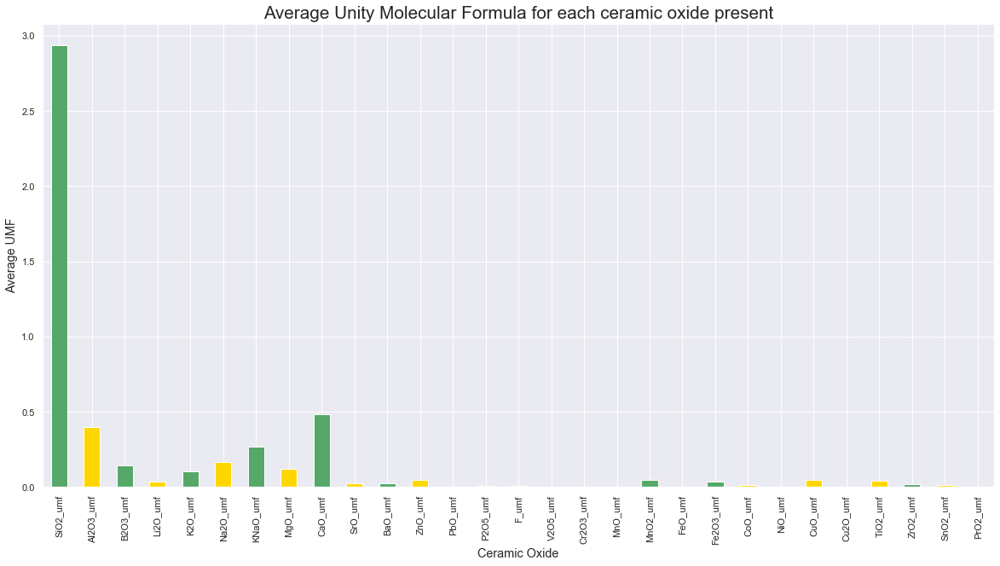

In [2560]:
percent_df=pd.DataFrame()
percent_df = glaze_df[['SiO2_umf','Al2O3_umf','B2O3_umf',
                        'Li2O_umf','K2O_umf','Na2O_umf',
                        'KNaO_umf','MgO_umf','CaO_umf',
                        'SrO_umf','BaO_umf','ZnO_umf',
                        'PbO_umf','P2O5_umf','F_umf',
                        'V2O5_umf','Cr2O3_umf','MnO_umf',
                        'MnO2_umf','FeO_umf','Fe2O3_umf',
                        'CoO_umf','NiO_umf','CuO_umf',
                        'Cu2O_umf','TiO2_umf','ZrO2_umf',
                        'SnO2_umf','PrO2_umf']].mean()
percent_df.head()
plt.figure(figsize=(20,10))
percent_df.plot.bar(color=['g','gold'])
plt.xlabel('Ceramic Oxide',fontsize = 'large')
plt.ylabel('Average UMF',fontsize = 'large')
plt.title('Average Unity Molecular Formula for each ceramic oxide present', fontsize = 'xx-large')
plt.show()

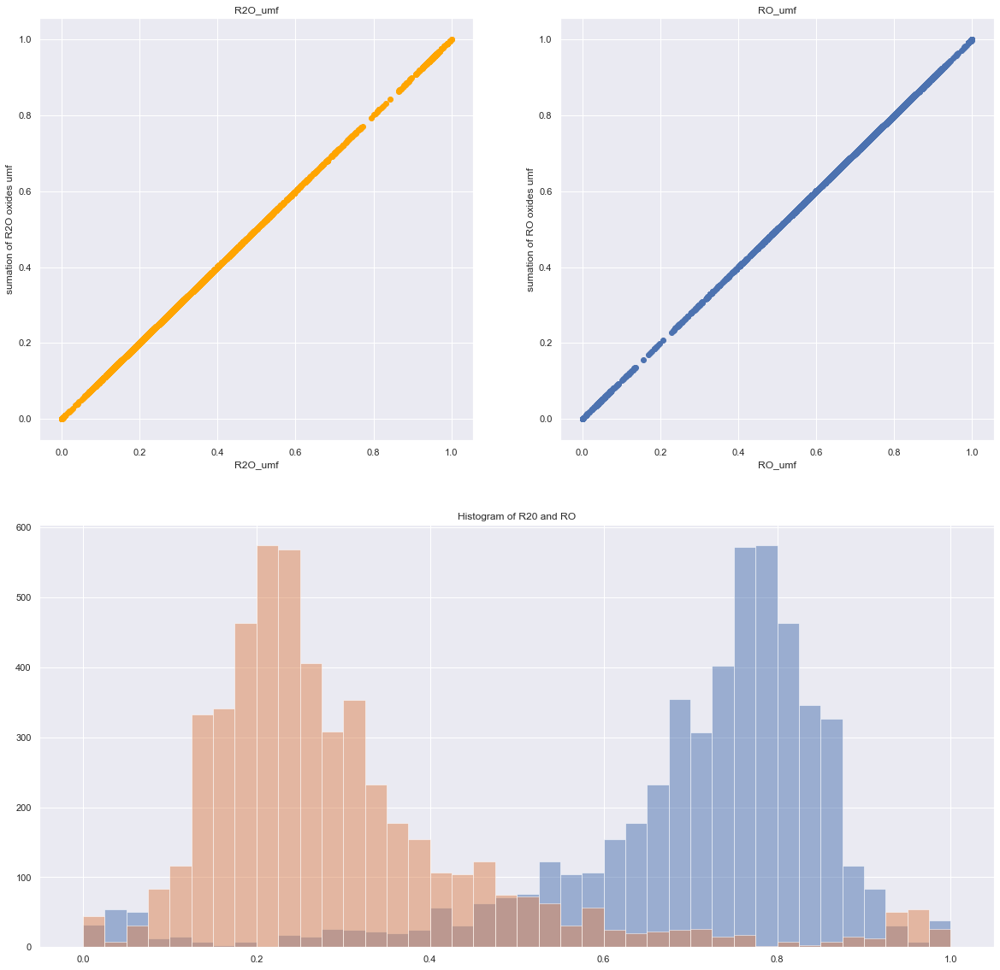

In [2561]:
#test to see what metal oxides are included in RO and R2O

glaze_df['R2O_umf_sum']=glaze_df['Li2O_umf']+glaze_df['K2O_umf']+glaze_df['Na2O_umf']

glaze_df['RO_umf_sum']=glaze_df['MgO_umf']+glaze_df['CaO_umf']+glaze_df['SrO_umf']+glaze_df['BaO_umf']+glaze_df['ZnO_umf']+glaze_df['PbO_umf']+glaze_df['MnO_umf']
#glaze_df['P2O5_umf']
##+glaze_df['KNaO_umf']
#+glaze_df['PbO_umf']#+
plt.figure(figsize=(20,20))
plt.subplot(2,2,1)
plt.scatter(glaze_df.R2O_umf_sum,
            glaze_df.R2O_umf,
            color = 'orange')
plt.xlabel('R2O_umf')
plt.ylabel('sumation of R2O oxides umf')
plt.title('R2O_umf')

plt.subplot(2,2,2)
plt.scatter(glaze_df.RO_umf_sum,glaze_df.RO_umf)
plt.ylabel('sumation of RO oxides umf')
plt.xlabel('RO_umf')
plt.title('RO_umf')


plt.subplot(2,1,2)
glaze_df[['R2O_umf','RO_umf' ]].describe()
plt.hist(glaze_df['RO_umf' ],bins = 40,alpha = 0.5)
plt.hist(glaze_df['R2O_umf'],bins = 40,alpha = 0.5)
plt.title('Histogram of R20 and RO')
plt.show()
#glaze_df[['R2O_umf','RO_umf' ]].describe()

In the diagram above the histogram of R2O and RO can be seen. In a Unity Molecular Formula the sum of the fluxes R2O and RO are set equal to one, this explains the symmetry in the histograms seen above. All other materials are taken as a ratio of the fluxes in moles. The scatter plots above specify which metal oxides are being sumated to form R2O and RO fluxes. 
RO fluxes include oxides with : Magnesium, Calcium, Strontium, Barium, Zinc, Lead, and Manganese. 
R2O fluxes include oxides with: Lithium, Sodium, Potassium. 

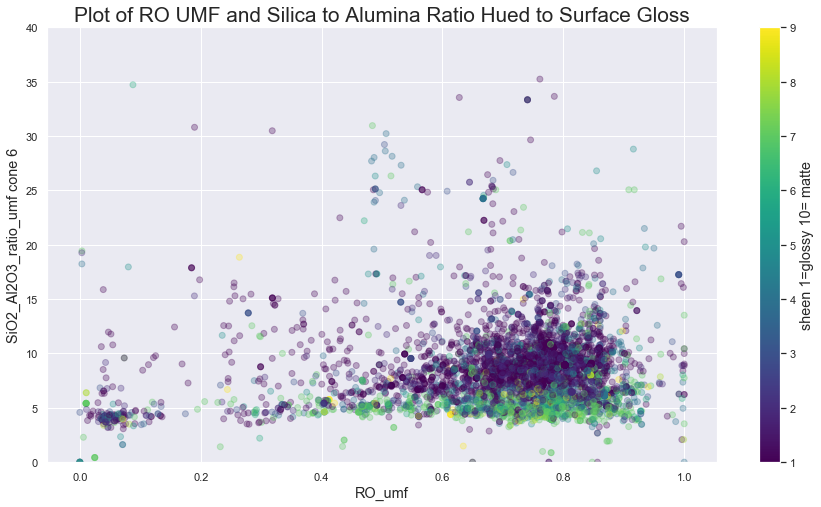

In [2562]:
plt.figure(figsize=(15,8))

xvar4 = glaze_df['RO_umf']
yvar4 = glaze_df['SiO2_Al2O3_ratio_umf']
cmap2 = plt.cm.viridis
norm2 = matplotlib.colors.Normalize(vmin=glaze_df.sheen_value.min(), vmax=glaze_df.sheen_value.max())
c2 = cmap2(norm2(glaze_df.sheen_value.values))

plt.scatter(xvar4,yvar4,c=glaze_df.sheen_value,cmap='viridis', alpha = 0.3)
plt.ylabel('SiO2_Al2O3_ratio_umf cone 6',fontsize = 'large')
plt.xlabel('RO_umf',fontsize = 'large')
plt.title('Plot of RO UMF and Silica to Alumina Ratio Hued to Surface Gloss',fontsize = 'xx-large')

sm2 = plt.cm.ScalarMappable(cmap=cmap2, norm=norm2)
plt.colorbar(sm2).set_label('sheen 1=glossy 10= matte', rotation=90,fontsize = 'large')
plt.ylim(0,40)

plt.show()

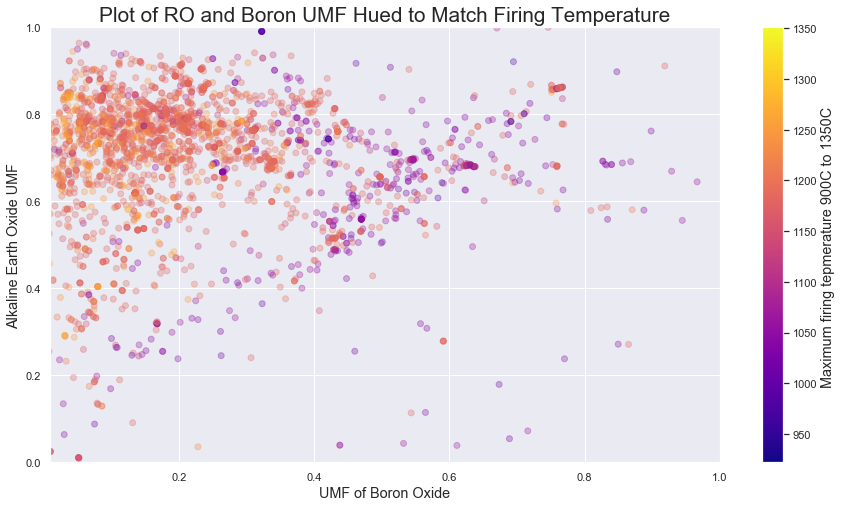

In [2563]:
plt.figure(figsize=(15,8))

xvar4 = glaze_df['B2O3_umf']
yvar4 = glaze_df['RO_umf']
cmap2 = plt.cm.plasma
norm2 = matplotlib.colors.Normalize(vmin=glaze_df.to_Degrees_C.min(), vmax=glaze_df.to_Degrees_C.max())
c2 = cmap2(norm2(glaze_df.to_Degrees_C.values))

plt.scatter(xvar4,yvar4,c=glaze_df.to_Degrees_C,cmap='plasma', alpha = 0.3)
plt.ylabel('Alkaline Earth Oxide UMF',fontsize = 'large')
plt.xlabel('UMF of Boron Oxide',fontsize = 'large')
plt.title('Plot of RO and Boron UMF Hued to Match Firing Temperature',fontsize = 'xx-large')

sm2 = plt.cm.ScalarMappable(cmap=cmap2, norm=norm2)
plt.colorbar(sm2).set_label('Maximum firing tepmerature 900C to 1350C ', rotation=90,fontsize = 'large')
plt.ylim(0,1)
plt.xlim(0.01,1)

plt.show()

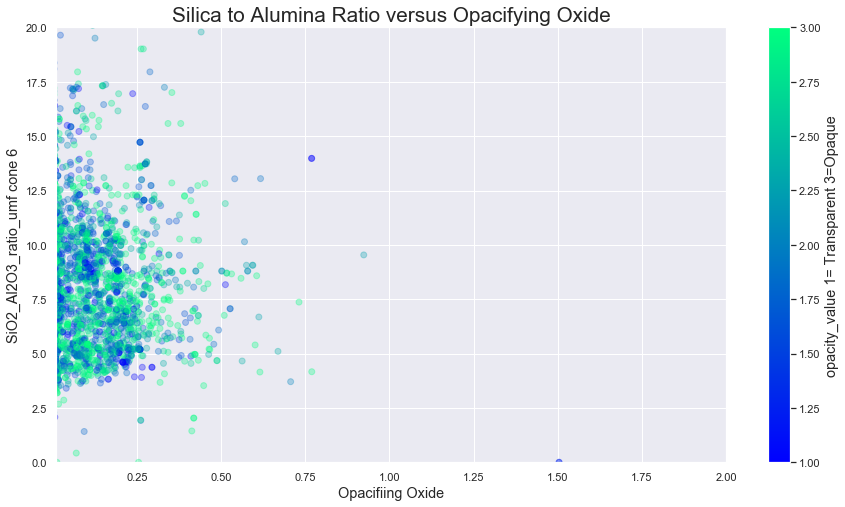

In [2564]:
plt.figure(figsize=(15,8))

xvar4 = glaze_df['opacifier_sum']
yvar4 = glaze_df['SiO2_Al2O3_ratio_umf']
cmap2 = plt.cm.winter
norm2 = matplotlib.colors.Normalize(vmin=glaze_df.opacity_value.min(), vmax=glaze_df.opacity_value.max())
c2 = cmap2(norm2(glaze_df.opacity_value.values))

plt.scatter(xvar4,yvar4,c=glaze_df.sum_color,cmap='winter', alpha = 0.3)
plt.ylabel('SiO2_Al2O3_ratio_umf cone 6',fontsize = 'large')
plt.xlabel('Opacifiing Oxide',fontsize = 'large')
plt.title('Silica to Alumina Ratio versus Opacifying Oxide',fontsize = 'xx-large')

sm2 = plt.cm.ScalarMappable(cmap=cmap2, norm=norm2)
plt.colorbar(sm2).set_label('opacity_value 1= Transparent 3=Opaque', rotation=90,fontsize = 'large')
plt.ylim(0,20)
plt.xlim(0.01,2)

plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

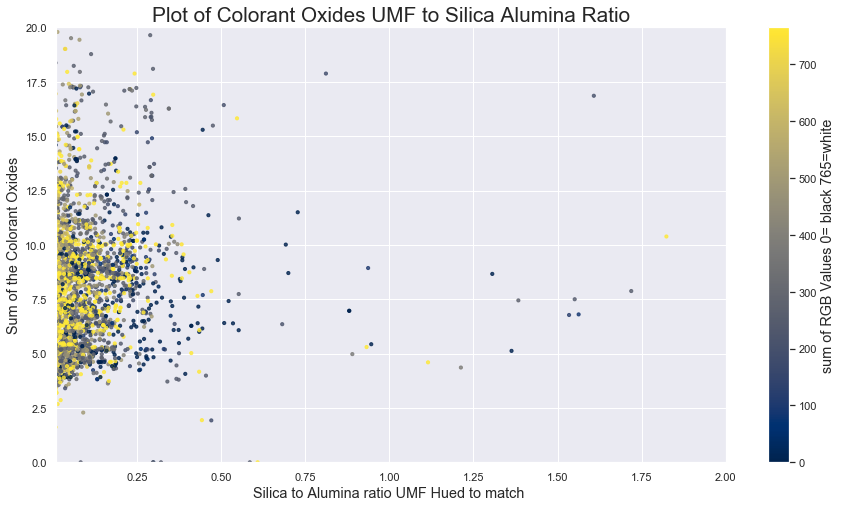

In [2565]:
plt.figure(figsize=(15,8))
cmap2 = plt.cm.cividis
norm2 = matplotlib.colors.Normalize(vmin=glaze_df.sum_color.min(), vmax=glaze_df.sum_color.max())
c2 = cmap2(norm2(glaze_df.sum_color.values))



xvar3 = glaze_df['colorant_oxide_sum']
yvar3 = glaze_df['SiO2_Al2O3_ratio_umf']
plt.scatter(xvar3,yvar3,
            c=glaze_df['sum_color']
            ,cmap='cividis',s=10, alpha = 0.8)
plt.ylabel('Sum of the Colorant Oxides',fontsize = 'large')
plt.xlabel('Silica to Alumina ratio UMF Hued to match ',fontsize = 'large')
plt.title('Plot of Colorant Oxides UMF to Silica Alumina Ratio',fontsize = 'xx-large')
plt.ylim(0,20)
plt.xlim(-0.1,2)


sm2 = plt.cm.ScalarMappable(cmap=cmap2, norm=norm2)
plt.colorbar(sm2).set_label('sum of RGB Values 0= black 765=white', rotation=90,fontsize = 'large')
plt.ylim(0,20)
plt.xlim(0.01,2)

plt.show

In [2566]:
# select the features and standardize them 

X = glaze_df[[  
    'to_Degrees_C','sheen_value',
                  'sum_color',
                    'SiO2_umf',
                    'Al2O3_umf',
                    'B2O3_umf', 
                    'SiO2_Al2O3_ratio_umf',
                    'R2O_umf',
                    'RO_umf','colorant_oxide_sum','opacifier_sum']].fillna(0)

scaler = StandardScaler()
X_std = scaler.fit_transform(X)


#'P2O5_umf',colorant_oxide_sum','opacifier_sum' from_Degrees_C 'sheen_value',
#                  'sum_color',
                #'is_glossy',


# Conduct UMAP for cluster visualization purposes 

In [2567]:

# Dimensionality reduction 
#UMAP
umap_results = umap.UMAP(n_neighbors=15,
                      min_dist=0.1,
                      #metric='correlation',
                       #metric='cosine',
                      metric='euclidean',
                        n_components=2,
                        random_state=10
                        ).fit_transform(X_std)





#print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

In [2568]:
#adding the UMAP Projections to the dataframe 
for n in range(2):
    glaze_df['UMAP{}'.format(n+1)]= umap_results[:, n]


#glaze_df[['UMAP1','UMAP2']]


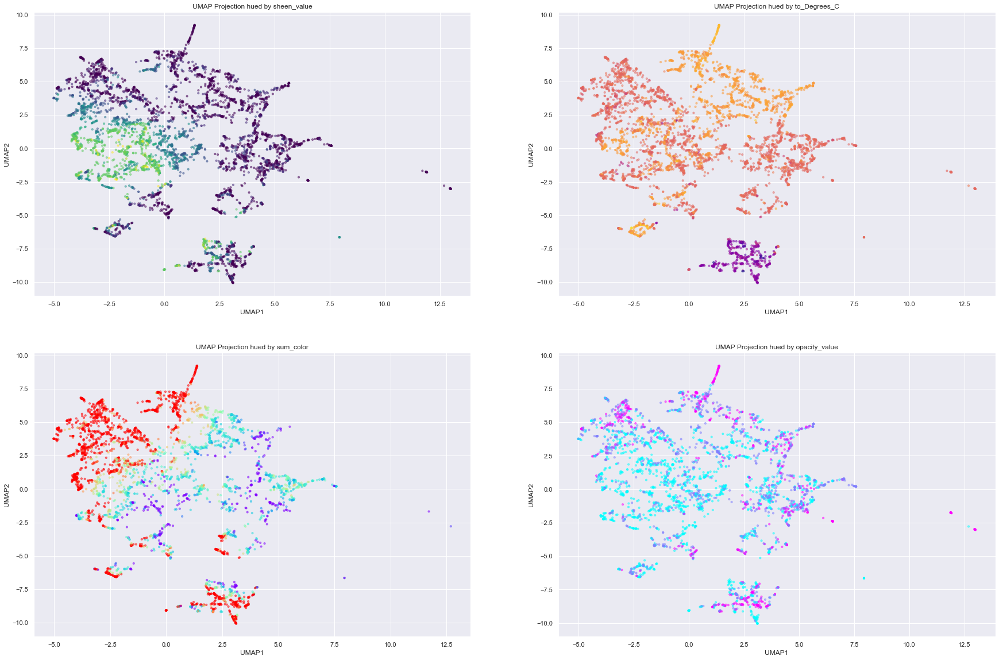

In [2569]:
hue_list=[['sheen_value','viridis'],
          ['to_Degrees_C','plasma'],
          ['sum_color','rainbow'],
          ['opacity_value','cool']]
plt.figure(figsize=(30,20))
sns.set(rc={ 'figure.facecolor':'white'})

for i,hue in enumerate(hue_list):
    plt.subplot(2,2,i+1)
    plt.title('UMAP')
    plt.scatter(glaze_df['UMAP1'],  
                glaze_df['UMAP2'],
                c=glaze_df[hue[0]] ,
                s=10,
                cmap=hue[1],
                alpha = .5)
    plt.ylabel('UMAP2')
    plt.xlabel('UMAP1')
    plt.title('UMAP Projection hued by {}'.format(hue[0]))

In [2570]:
umap_std = scaler.fit_transform(umap_results)
for n in range(2):
    glaze_df['UMAP_std{}'.format(n+1)]= umap_std[:, n]



# Split Data for Cluster Evaluation

In [2571]:
#split the dataset to compare clustering techniques
X_std1, X_std2, glaze_df_half1, glaze_df_half2,umap_std1,umap_std2 = train_test_split(
    X_std,
    glaze_df,umap_std,
    test_size=0.5,
    random_state=13579)

print(len(glaze_df_half1))
print(len(glaze_df_half2))
print(len(glaze_df))

2577
2577
5154


## Clustering

There are a lot of glazes that fall well outside the chemistry of a normal glaze, these are often 'effects glazes' that are used for a particular physical or visual quality, an example might be a metal saturate glaze that mimics the look of metal, or a crystalline glaze that forms crystals from devitrified silica. It is likely that DBSCAN will be useful however Kmeans and Gaussian Mixture Models will also be applied and compaired. 

### K-means Clustering¶

In [2572]:

Sum_of_squared_distances = []
Mannhattan_silhouette_scores = []
Euclidean_silhouette_scores = []
cosine_silhouette_scores = []

K = range(1,25)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(umap_std)
    Sum_of_squared_distances.append(km.inertia_)
    try:
        klusters = km.fit_predict(umap_std)
        Mannhattan_silhouette_scores.append(metrics.silhouette_score(umap_std, klusters, metric='manhattan'))
        Euclidean_silhouette_scores.append(metrics.silhouette_score(umap_std, klusters, metric='euclidean'))
        cosine_silhouette_scores.append(metrics.silhouette_score(umap_std, klusters, metric='cosine'))

    except:
        Mannhattan_silhouette_scores.append(1)
        Euclidean_silhouette_scores.append(1)
        cosine_silhouette_scores.append(1)
        None


plt.show()

Text(0.5, 1.0, 'Silhouette Scores For Optimal k')

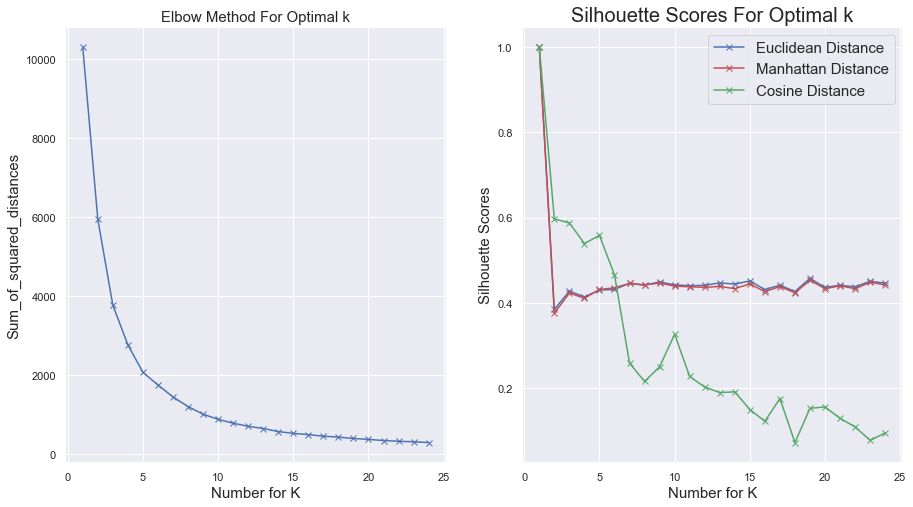

In [2573]:

plt.figure(figsize=(15,8))  
plt.subplot(1,2,1)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('Number for K',fontsize=15)
plt.ylabel('Sum_of_squared_distances',fontsize=15)
plt.title('Elbow Method For Optimal k',fontsize=15)
plt.subplot(1,2,2)
labels = ['Euclidean Distance','Manhattan Distance','Cosine Distance']

plt.plot(K, Euclidean_silhouette_scores, 'bx-',color='b',label=labels[0])
plt.plot(K, Mannhattan_silhouette_scores, 'bx-',color='r',label=labels[1])
plt.plot(K, cosine_silhouette_scores,'bx-',color='g', label=labels[2])

plt.legend(fontsize=15)
plt.xlabel('Number for K',fontsize=15)
plt.ylabel('Silhouette Scores',fontsize=15)
plt.title('Silhouette Scores For Optimal k',fontsize=20)



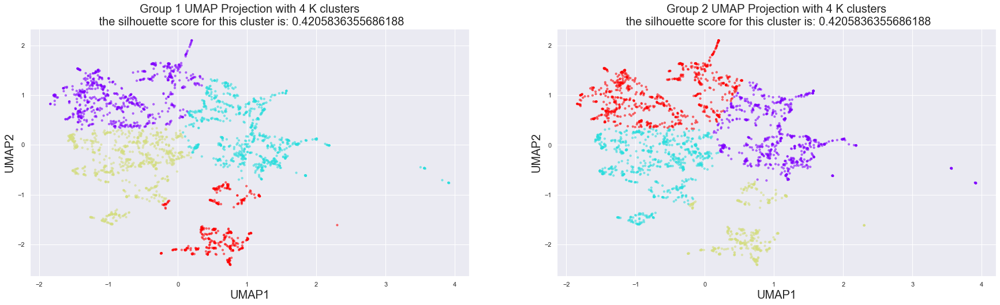

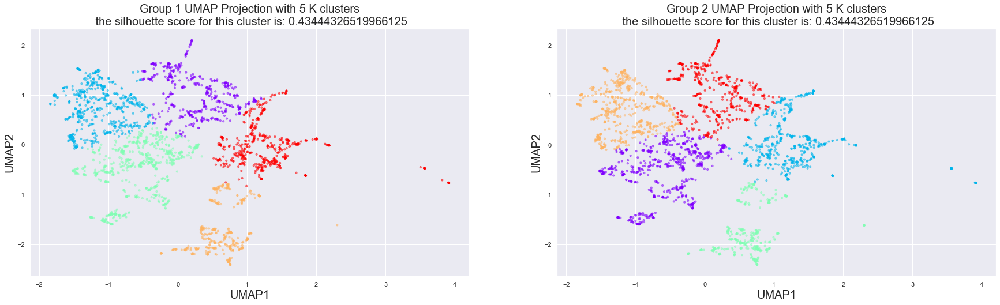

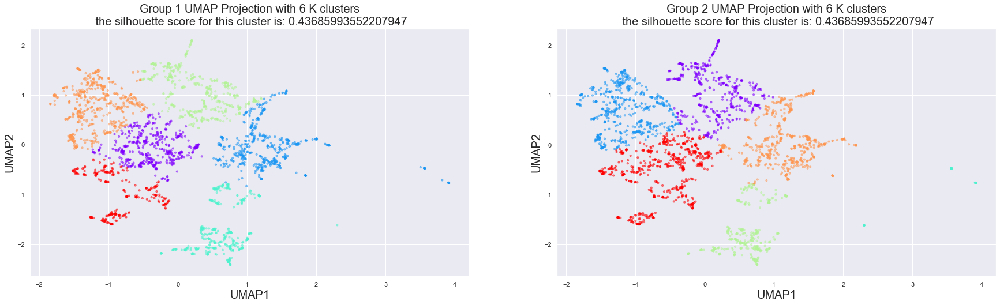

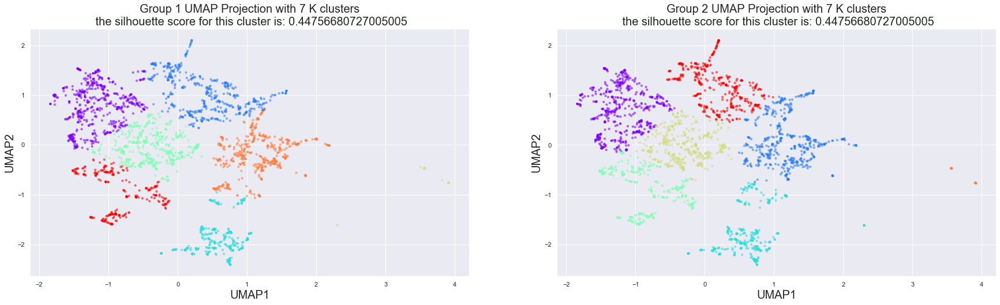

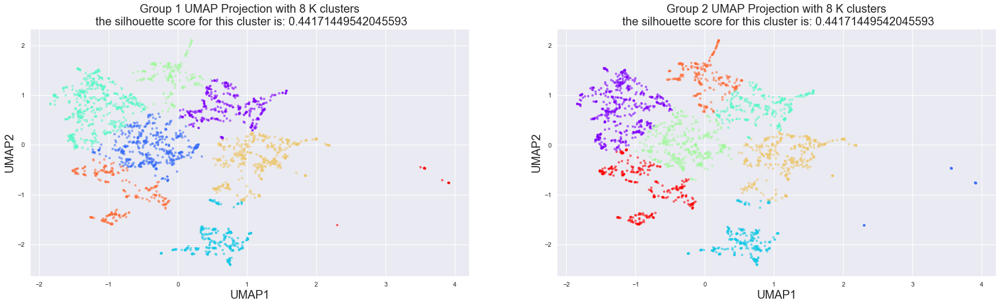

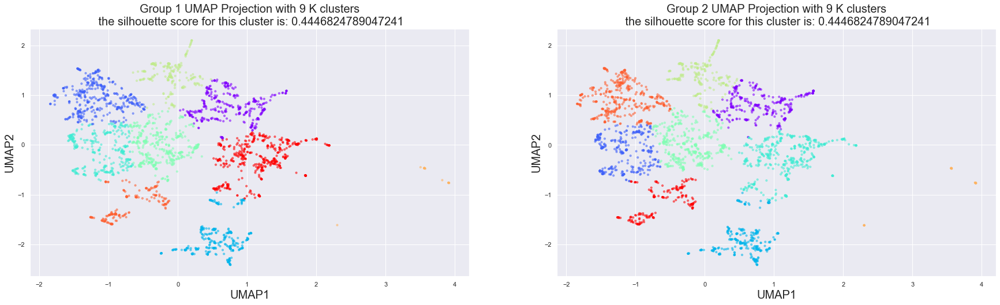

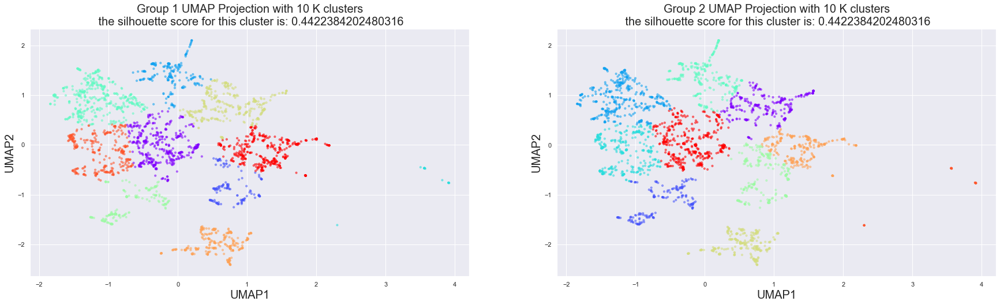

In [2574]:
#Check for consistancy 

for i in range(4,11):
    n_clusters=i
    km = KMeans(n_clusters,)
    K_clusters1 = km.fit_predict(umap_std1)
    K_clusters2 = km.fit_predict(umap_std2)
    
    sil_score1 = metrics.silhouette_score(umap_std1, K_clusters1, metric='euclidean')
    sil_score2 = metrics.silhouette_score(umap_std2, K_clusters2, metric='euclidean')

    #plot the data 
    position = (i-3)*2
    plt.figure(figsize=(30,150))
    sns.set(rc={ 'figure.facecolor':'white'})

    plt.subplot(16,2,position-1)
    plt.title('UMAP')

    plt.scatter(umap_std1[:, 0],
            umap_std1[:, 1],
            c=K_clusters1 ,
            s=10,
            cmap='rainbow',
            alpha = .5)
    plt.ylabel('UMAP2',fontsize=20)
    plt.xlabel('UMAP1',fontsize=20)
    plt.title('Group 1 UMAP Projection with {} K clusters\n the silhouette score for this cluster is: {}'.format(i,sil_score1),fontsize=20)


    plt.subplot(16,2,position)
    plt.title('UMAP')

    plt.scatter(umap_std2[:, 0],
            umap_std2[:, 1],
            c=K_clusters2,
            s=10,
            cmap='rainbow',
             alpha = .5)
    plt.ylabel('UMAP2',fontsize=20)
    plt.xlabel('UMAP1',fontsize=20)
    plt.title('Group 2 UMAP Projection with {} K clusters\n the silhouette score for this cluster is: {}'.format(i,sil_score1),fontsize=20)


Beyond K=6 clusters begin to lack consistency even though their silhouette scores continue to rise clusters of 8 and 9 show consistency and higher silhouette scores suggesting that there could be clusters that exhist beyond k=5, but to be safe we will stick with K=5. 

In [2575]:
n_clusters=5
km = KMeans(n_clusters,)
K_clusters1 = km.fit_predict(umap_std1)
K_clusters2 = km.fit_predict(umap_std2)
glaze_df_half1['K_clusters']=K_clusters1
glaze_df_half2['K_clusters']=K_clusters2

K_clusters = km.fit_predict(umap_std)

glaze_df['K_clusters']=K_clusters

sil_score = metrics.silhouette_score(umap_std, K_clusters, metric='euclidean')
if sil_score>0:
    print("{} the silhouette score is positive\n the preseence of {} clusters is likely".format(sil_score,n_clusters))

else:
    print("{} the silhouette score is negative\n the preseence of {} clusters is not likely".format(sil_score,n_clusters))


0.4298093318939209 the silhouette score is positive
 the preseence of 5 clusters is likely


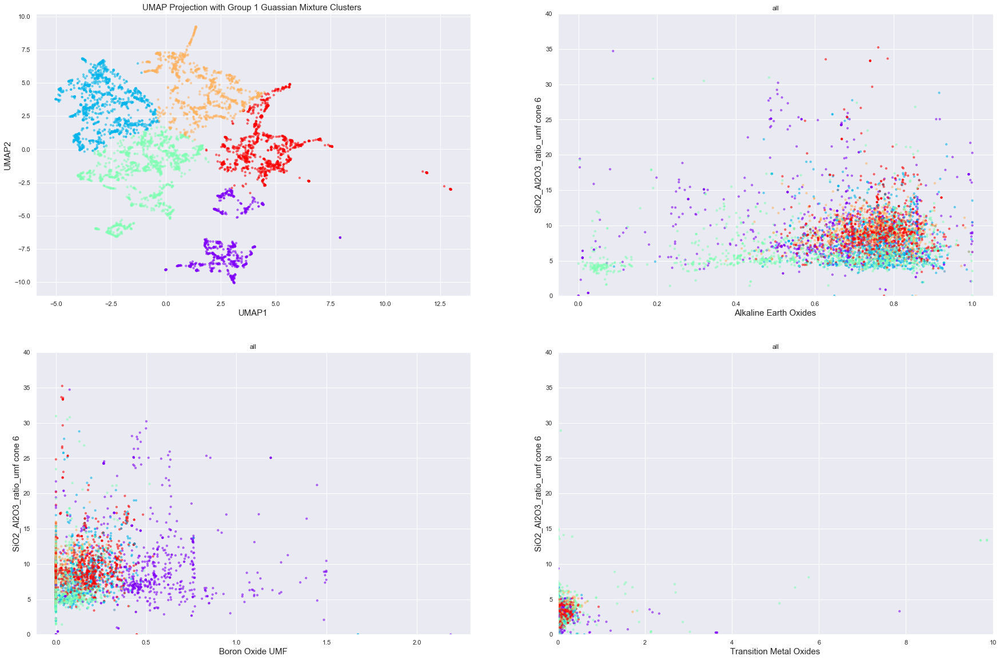



 cluster 0 has 1271 datapoints
 cluster 1 has 1185 datapoints
 cluster 2 has 1039 datapoints
 cluster 3 has 945 datapoints
 cluster 4 has 714 datapoints


In [2576]:
plt.figure(figsize=(30,20))

plt.subplot(2,2,1)
plt.title('UMAP',fontsize=15)

plt.scatter(glaze_df['UMAP1'],  glaze_df['UMAP2'],
            c=glaze_df['K_clusters'],s=10,cmap='rainbow',
            alpha = .5)
plt.ylabel('UMAP2',fontsize=15)
plt.xlabel('UMAP1',fontsize=15)
plt.title('UMAP Projection with Group 1 Guassian Mixture Clusters ',fontsize=15)

plt.subplot(2,2,2)
xvar1 = glaze_df['RO_umf']
yvar1 = glaze_df['SiO2_Al2O3_ratio_umf']
plt.scatter(xvar1,yvar1,
            c=glaze_df['K_clusters'],
            cmap='rainbow',
            s=10, alpha = 0.5)
plt.ylabel('SiO2_Al2O3_ratio_umf cone 6',fontsize=15)
plt.xlabel('Alkaline Earth Oxides',fontsize=15)
plt.title('all')
plt.ylim(0,40)


plt.subplot(2,2,3)
xvar1 = glaze_df['B2O3_umf']
yvar1 = glaze_df['SiO2_Al2O3_ratio_umf']
plt.scatter(xvar1,yvar1,
            c=glaze_df['K_clusters'],
            cmap='rainbow',
            s=10, alpha = 0.5)
plt.ylabel('SiO2_Al2O3_ratio_umf cone 6',fontsize=15)
plt.xlabel('Boron Oxide UMF',fontsize=15)
plt.title('all')
plt.ylim(0,40)


plt.subplot(2,2,4)
xvar1 = glaze_df['colorant_oxide_sum']
yvar1 = glaze_df['SiO2_umf']
plt.scatter(xvar1,yvar1,
            c=glaze_df['K_clusters'],
            cmap='rainbow',
            s=10, alpha = 0.5)
plt.ylabel('SiO2_Al2O3_ratio_umf cone 6',fontsize=15)
plt.xlabel('Transition Metal Oxides',fontsize=15)
plt.title('all')
plt.ylim(0,40)
plt.xlim(0,10)

plt.show()


labels = KMeans(n_clusters=3, random_state=123).fit_predict(X_std)
#print(metrics.silhouette_score(X_std, labels, metric='euclidean'))
num_cluster=[]
num_cluster = glaze_df['K_clusters'].value_counts().to_list()
print('\n')
for i, num in enumerate( num_cluster):
    print(' cluster {} has {} datapoints'.format(i,num))

## Agglomerative Clustering 

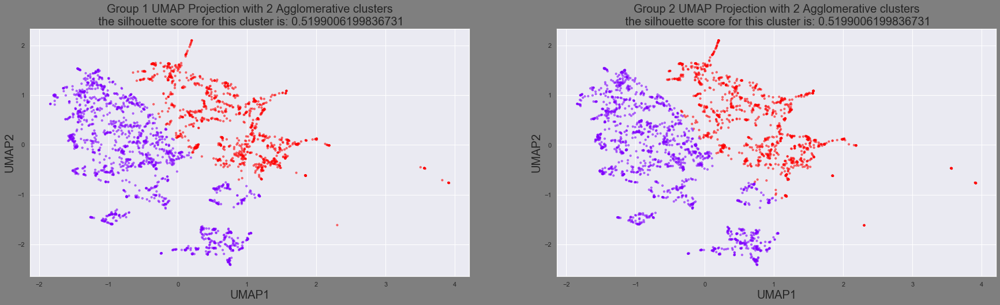

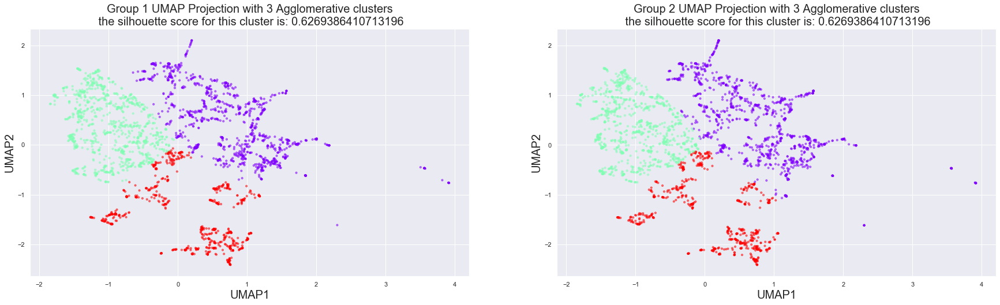

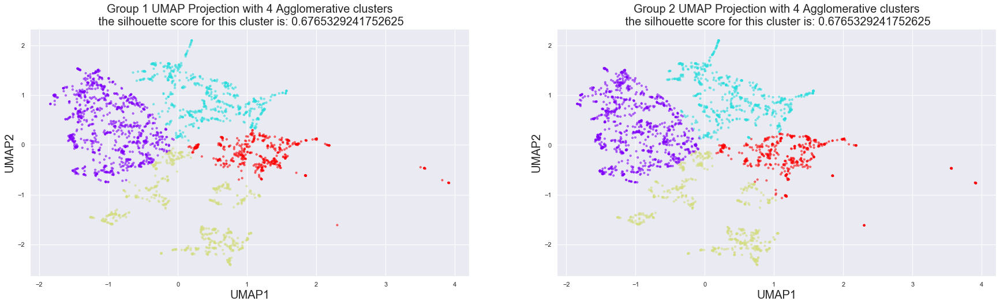

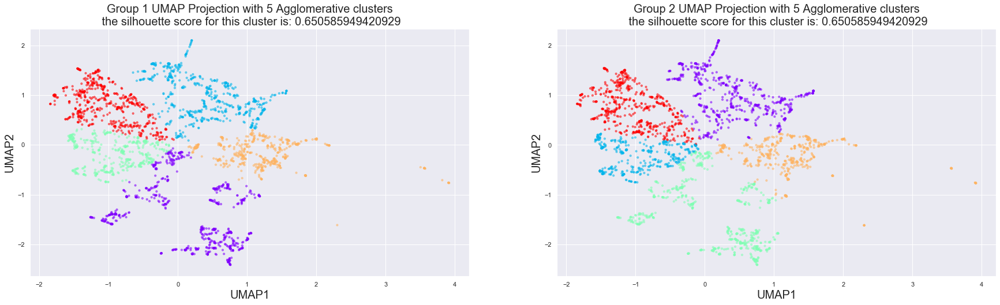

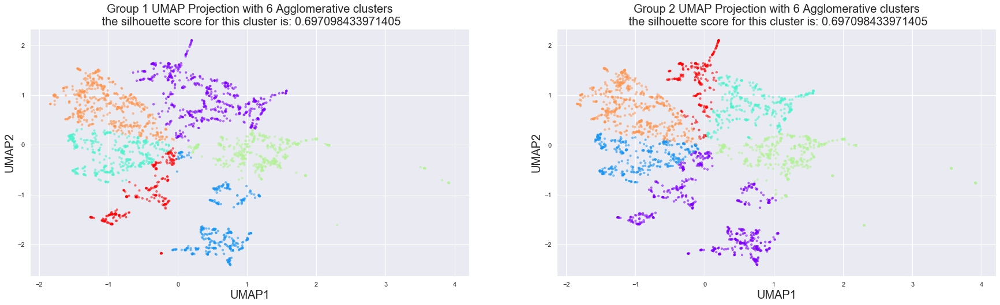

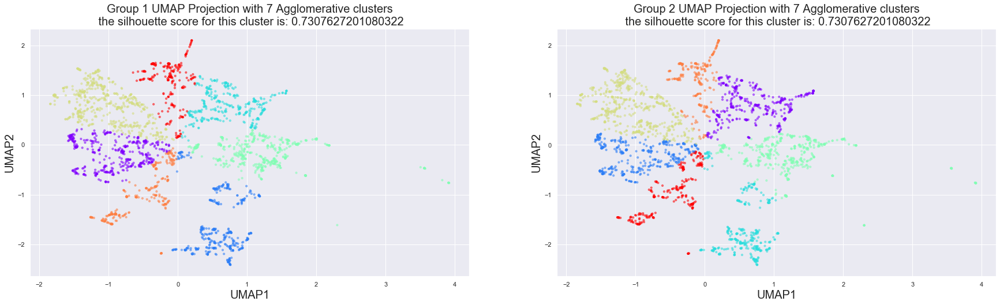

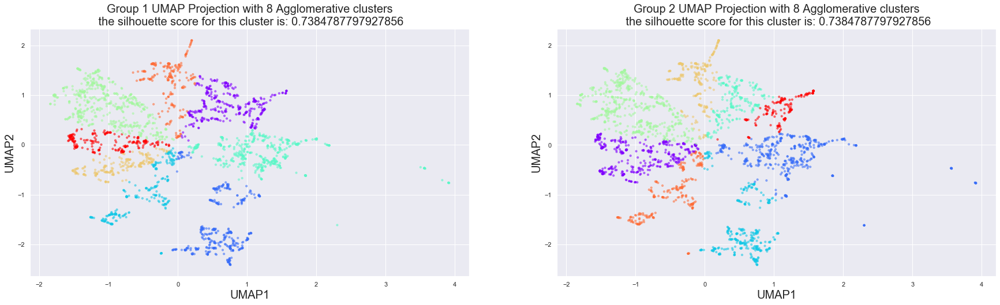

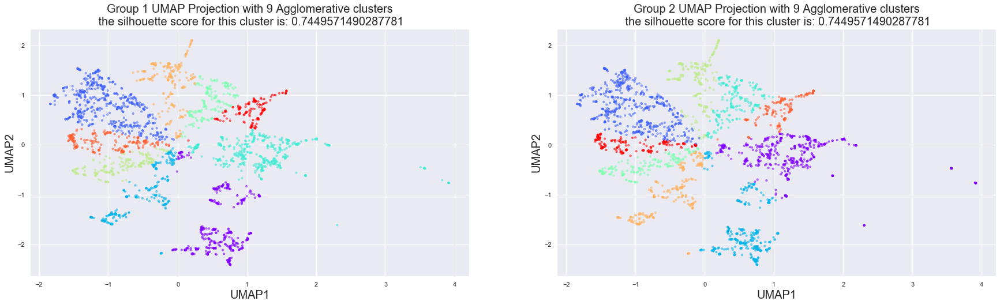

In [2598]:
#Check for consistancy 

for i in range(2,10):
    # define the clustering algorithm
    num_clusters=i
    comp_aglomerative_clust = AgglomerativeClustering(linkage  = 'average',
                                            affinity  = 'cosine',
                                            n_clusters= num_clusters)
    
    agg_clusters1 = comp_aglomerative_clust.fit_predict(umap_std1)
    agg_clusters2 = comp_aglomerative_clust.fit_predict(umap_std2)
    
    sil_score1 = metrics.silhouette_score(umap_std1, agg_clusters1, metric='cosine')
    sil_score2 = metrics.silhouette_score(umap_std2, agg_clusters2, metric='cosine')

    #plot the data 
    position = (i-1)*2
    plt.figure(figsize=(30,150))
    sns.set(rc={ 'figure.facecolor':'white'})

    plt.subplot(16,2,position-1)
    plt.title('UMAP')

    plt.scatter(umap_std1[:, 0],
            umap_std1[:, 1],
            c=agg_clusters1 ,
            s=10,
            cmap='rainbow',
            alpha = .5)
    plt.ylabel('UMAP2',fontsize=20)
    plt.xlabel('UMAP1',fontsize=20)
    plt.title('Group 1 UMAP Projection with {} Agglomerative clusters\n the silhouette score for this cluster is: {}'.format(i,sil_score1),fontsize=20)


    plt.subplot(16,2,position)
    plt.title('UMAP')

    plt.scatter(umap_std2[:, 0],
            umap_std2[:, 1],
            c=agg_clusters2,
            s=10,
            cmap='rainbow',
             alpha = .5)
    plt.ylabel('UMAP2',fontsize=20)
    plt.xlabel('UMAP1',fontsize=20)
    plt.title('Group 2 UMAP Projection with {} Agglomerative clusters\n the silhouette score for this cluster is: {}'.format(i,sil_score1),fontsize=20)


The Agglomerative clustesr apear inconsistent after 6 clusters and apear in an as a pizza wedge  shapes. 

### GMM Clustering 


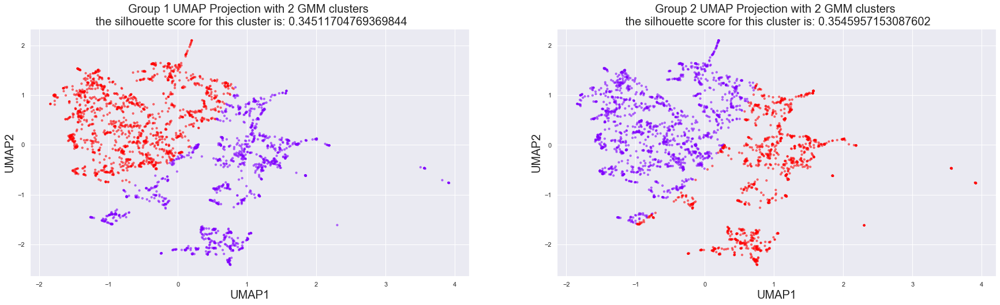

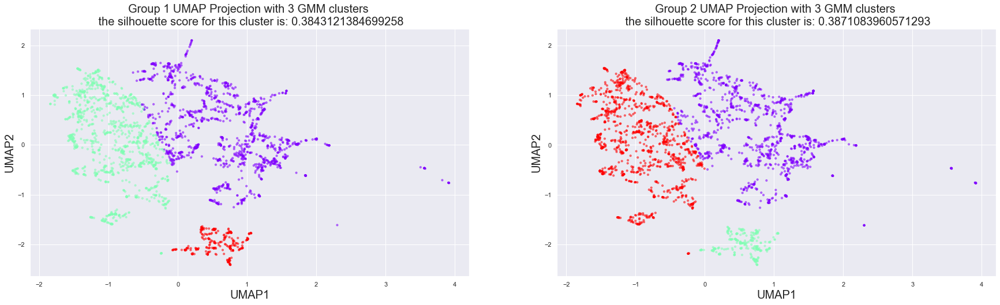

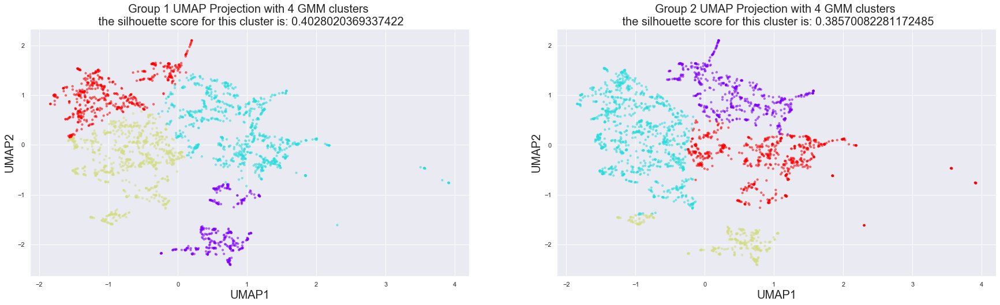

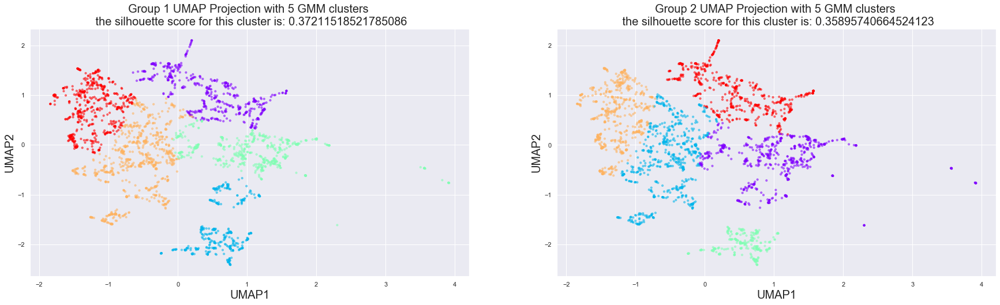

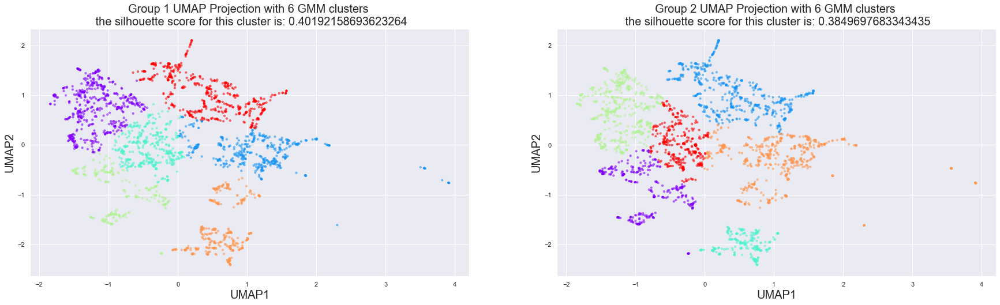

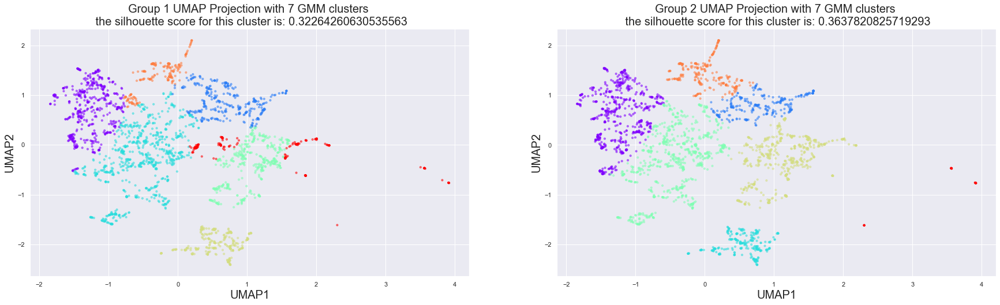

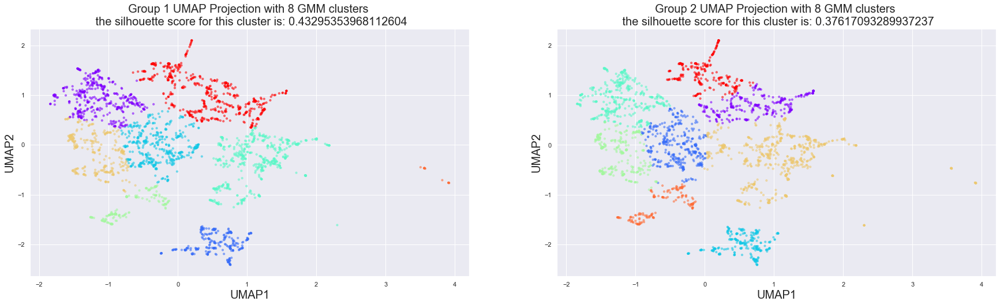

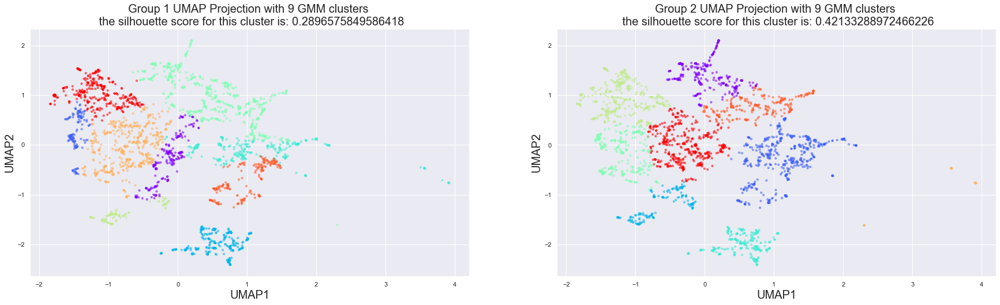

In [2578]:
#Check for consistancy 

for i in range(2,10):
    # define the clustering algorithm
    GMM = GaussianMixture(n_components=i,
                      covariance_type='full', #'full', 'tied', 
                      tol=0.001,
                      reg_covar=1e-06,
                      max_iter=1000,
                      n_init=1,
                      init_params='kmeans',#‘random’kmeans
                      weights_init=None,
                      means_init=None,
                      precisions_init=None,
                      random_state=None,
                      warm_start=False,
                      verbose=0,
                      verbose_interval=10)
    GMM_clusters1 = GMM.fit_predict(umap_std1)
    GMM_clusters2 = GMM.fit_predict(umap_std2)
    
    sil_score1 = metrics.silhouette_score(umap_std1, GMM_clusters1, metric='mahalanobis')
    sil_score2 = metrics.silhouette_score(umap_std2, GMM_clusters2, metric='mahalanobis')

    #plot the data 
    position = (i-1)*2
    plt.figure(figsize=(30,150))
    sns.set(rc={ 'figure.facecolor':'white'})

    plt.subplot(16,2,position-1)
    plt.title('UMAP')

    plt.scatter(umap_std1[:, 0],
            umap_std1[:, 1],
            c=GMM_clusters1 ,
            s=10,
            cmap='rainbow',
            alpha = .5)
    plt.ylabel('UMAP2',fontsize=20)
    plt.xlabel('UMAP1',fontsize=20)
    plt.title('Group 1 UMAP Projection with {} GMM clusters \n the silhouette score for this cluster is: {}'.format(i,sil_score1),fontsize=20)


    plt.subplot(16,2,position)
    plt.title('UMAP')

    plt.scatter(umap_std2[:, 0],
            umap_std2[:, 1],
            c=GMM_clusters2,
            s=10,
            cmap='rainbow',
             alpha = .5)
    plt.ylabel('UMAP2',fontsize=20)
    plt.xlabel('UMAP1',fontsize=20)
    plt.title('Group 2 UMAP Projection with {} GMM clusters \n the silhouette score for this cluster is: {}'.format(i,sil_score2),fontsize=20)


The Gaussian Mixture clusters apear inconsistent even with 2 clusters 

### DBSCAN

In [2579]:
#Selection for Epsilon 

#range_eps = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,]

range_eps = np.linspace(0.1,2,19)
sil_score_Epsilon_euc=[]
sil_score_Epsilon_cos=[]
sil_score_Epsilon_man=[]

for i in  range_eps:
    #print("eps value is "+str(i))
    try:
        db_euc = DBSCAN(eps=i, min_samples = 15,metric='euclidean' ).fit(X_std)
        core_samples_mask = np.zeros_like(db_euc.labels_, dtype=bool)
        core_samples_mask[db_euc.core_sample_indices_] = True
        labels_euc = db_euc.labels_
        silhouette_avg_euc = silhouette_score(X_std,labels_euc)
    except:
        silhouette_avg_euc=np.nan
    
    try:
        db_man = DBSCAN(eps=i, min_samples = 15,metric='manhattan').fit(X_std)
        core_samples_mask = np.zeros_like(db_man.labels_, dtype=bool)
        core_samples_mask[db_man.core_sample_indices_] = True
        labels_man = db_man.labels_
        silhouette_avg_man = silhouette_score(X_std,labels_man)
    except:
        silhouette_avg_man=np.nan
    
    try:
        db_cos = DBSCAN(eps=i, min_samples = 15,metric='cosine').fit(X_std)
        core_samples_mask = np.zeros_like(db_cos.labels_, dtype=bool)
        core_samples_mask[db_cos.core_sample_indices_] = True
        labels_cos = db_cos.labels_
        silhouette_avg_cos = silhouette_score(X_std,labels_cos)
    except:
        silhouette_avg_cos=np.nan
        
    
    sil_score_Epsilon_euc.append(silhouette_avg_euc)
    sil_score_Epsilon_man.append(silhouette_avg_man)
    sil_score_Epsilon_cos.append(silhouette_avg_cos)

 


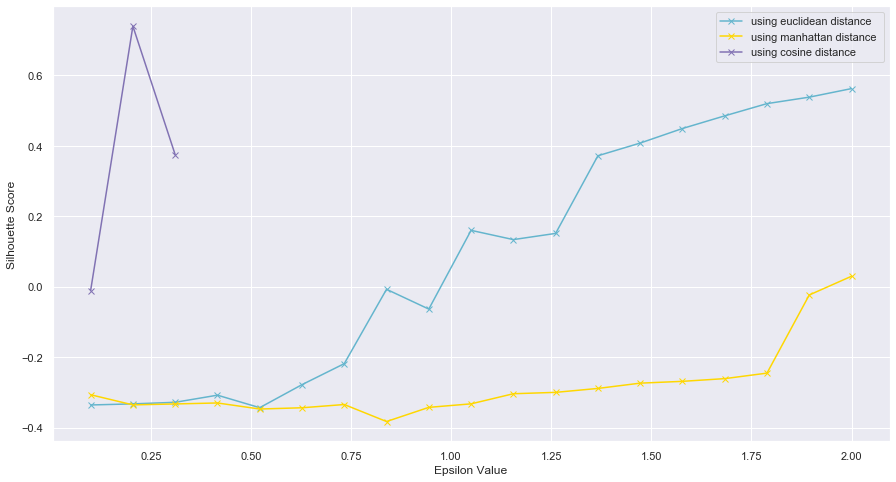

In [2580]:
plt.figure(figsize=(15,8))   
plt.plot(range_eps,sil_score_Epsilon_euc, 'bx-',color='c', label='using euclidean distance ')
plt.plot(range_eps,sil_score_Epsilon_man, 'bx-',color='gold',label='using manhattan distance ')
plt.plot(range_eps,sil_score_Epsilon_cos, 'bx-',color='m',label='using cosine distance ')

plt.legend()
plt.xlabel('Epsilon Value')
plt.ylabel('Silhouette Score')

plt.xticks()
plt.show()

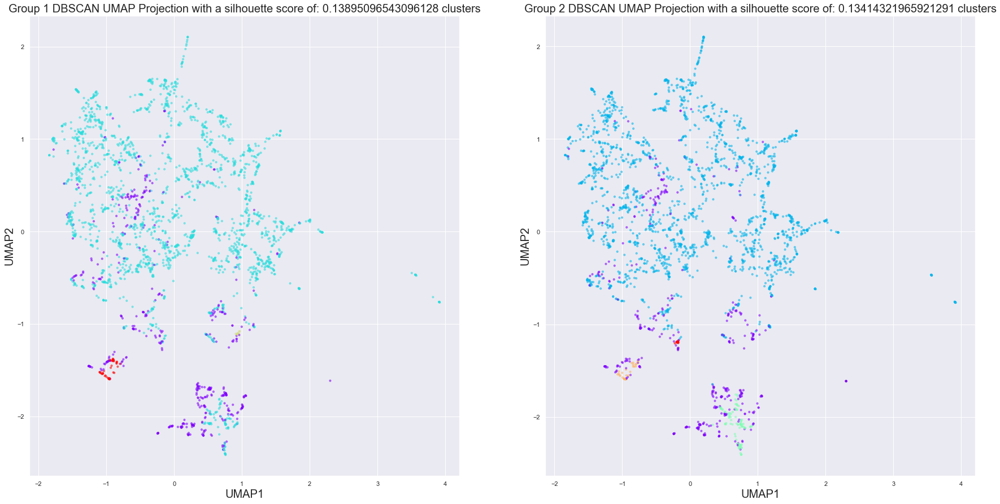

cluster1 [-1  0  1  2]
cluster2 [-1  0  1  2  3]


In [2581]:

# Defining the agglomerative clustering
#working
dbscan_cluster1 = DBSCAN(eps=1.27, min_samples=8,metric = "euclidean")#produces 3 clusters
dbscan_cluster2 = DBSCAN(eps=1.27, min_samples=8,metric = "euclidean")


#test
dbscan_clusters1 = dbscan_cluster1.fit_predict(X_std1)
dbscan_clusters2 = dbscan_cluster1.fit_predict(X_std2)

sil_score1 = metrics.silhouette_score(X_std1, dbscan_clusters1, metric='euclidean')
sil_score2 = metrics.silhouette_score(X_std2, dbscan_clusters2, metric='euclidean')


#plot the data 
plt.figure(figsize=(30,15))
sns.set(rc={ 'figure.facecolor':'white'})

plt.subplot(1,2,1)
plt.title('UMAP')

plt.scatter(umap_std1[:, 0],
        umap_std1[:, 1],
        c=dbscan_clusters1 ,
        s=10,
        cmap='rainbow',
        alpha = .5)
plt.ylabel('UMAP2',fontsize=20)
plt.xlabel('UMAP1',fontsize=20)
plt.title('Group 1 DBSCAN UMAP Projection with a silhouette score of: {} clusters'.format(sil_score1),fontsize=20)


plt.subplot(1,2,2)
plt.title('UMAP')

plt.scatter(umap_std2[:, 0],
        umap_std2[:, 1],
        c=dbscan_clusters2,
        s=10,
        cmap='rainbow',
         alpha = .5)
plt.ylabel('UMAP2',fontsize=20)
plt.xlabel('UMAP1',fontsize=20)
plt.title('Group 2 DBSCAN UMAP Projection with a silhouette score of: {} clusters'.format(sil_score2),fontsize=20)
plt.show()
print('cluster1',np.unique(dbscan_clusters1))
print('cluster2',np.unique(dbscan_clusters2))


In [2582]:
#DBSCAN Clustering

#working
#dbscan_cluster = DBSCAN(eps=1.27, min_samples=10,metric = "euclidean")#produces 3 clusters

dbscan_cluster = DBSCAN(eps=1.27, min_samples=16,metric = "euclidean")#produces 3 clusters

dbscan_clusters = dbscan_cluster.fit_predict(X_std)

glaze_df['dbscan_clusters']=dbscan_clusters

print('cluster ',np.unique(dbscan_clusters))




cluster  [-1  0  1  2]


0.15506506145031015 is the silhouette score for the total sample
 0    4254
-1     809
 1      76
 2      15
Name: dbscan_clusters, dtype: int64


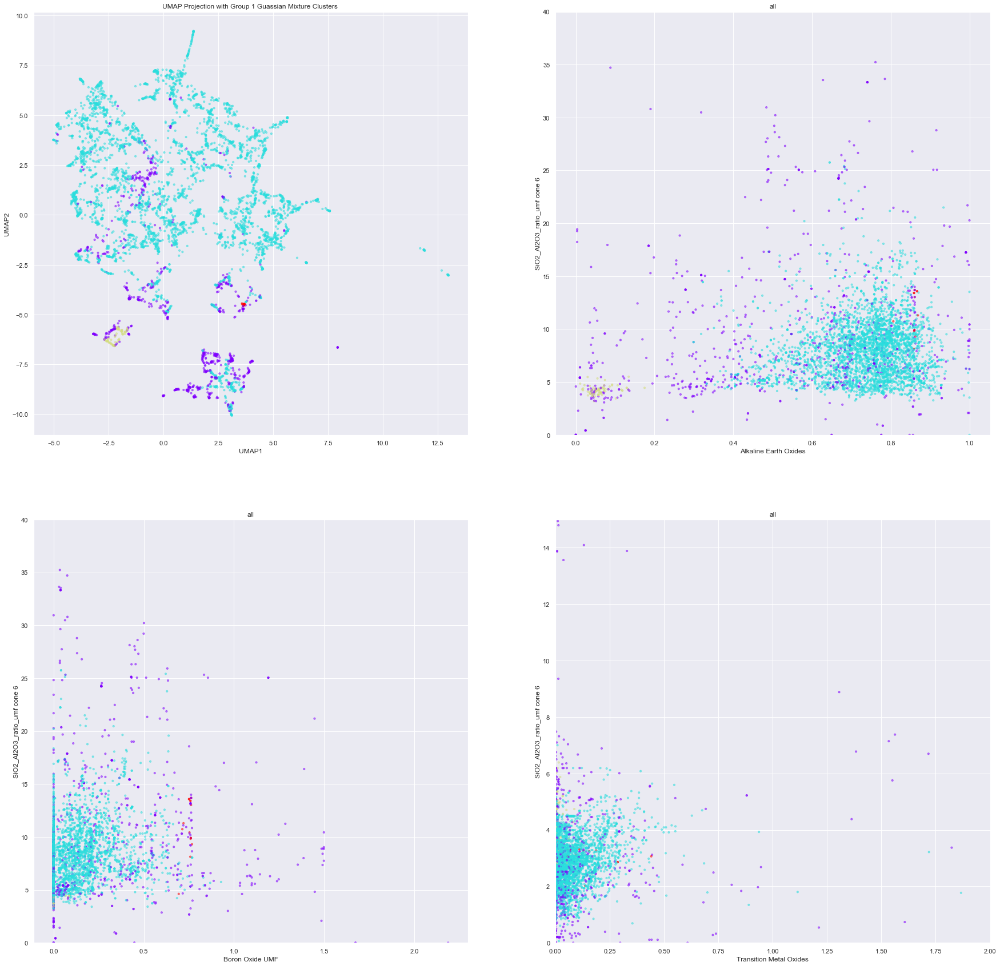

In [2583]:
#plot the first two results of each reduction technique
sil_score = metrics.silhouette_score(X_std, dbscan_clusters, metric='euclidean')


print("{} is the silhouette score for the total sample".format(sil_score))
num_cluster=[]
num_cluster = glaze_df['dbscan_clusters'].value_counts().to_list()
print(glaze_df['dbscan_clusters'].value_counts())



plt.figure(figsize=(30,30))
sns.set(rc={ 'figure.facecolor':'white'})

plt.subplot(2,2,1)
plt.title('UMAP')

plt.scatter(glaze_df['UMAP1'],  glaze_df['UMAP2'],
            c=glaze_df['dbscan_clusters'],s=10,cmap='rainbow',
            alpha = .5)
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP Projection with Group 1 Guassian Mixture Clusters ')

plt.subplot(2,2,2)
xvar1 = glaze_df['RO_umf']
yvar1 = glaze_df['SiO2_Al2O3_ratio_umf']
plt.scatter(xvar1,yvar1,
            c=glaze_df['dbscan_clusters'],
            cmap='rainbow',
            s=10, alpha = 0.5)
plt.ylabel('SiO2_Al2O3_ratio_umf cone 6')
plt.xlabel('Alkaline Earth Oxides')
plt.title('all')
plt.ylim(0,40)


plt.subplot(2,2,3)
xvar1 = glaze_df['B2O3_umf']
yvar1 = glaze_df['SiO2_Al2O3_ratio_umf']
plt.scatter(xvar1,yvar1,
            c=glaze_df['dbscan_clusters'],
            cmap='rainbow',
            s=10, alpha = 0.5)
plt.ylabel('SiO2_Al2O3_ratio_umf cone 6')
plt.xlabel('Boron Oxide UMF')
plt.title('all')
plt.ylim(0,40)


plt.subplot(2,2,4)
xvar1 = glaze_df['colorant_oxide_sum']
yvar1 = glaze_df['SiO2_umf']
plt.scatter(xvar1,yvar1,
            c=glaze_df['dbscan_clusters'],
            cmap='rainbow',
            s=10, alpha = 0.5)
plt.ylabel('SiO2_Al2O3_ratio_umf cone 6')
plt.xlabel('Transition Metal Oxides')
plt.title('all')
plt.ylim(0,15)
plt.xlim(0,2)

plt.show()

## Explore Clusters 
The only clusters that gave consistent results where the K means and DBSCAN clusters, they are compaired in plots below

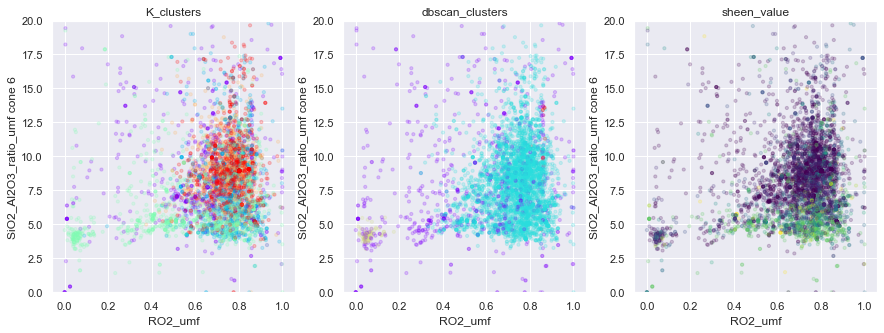

In [2584]:
 cluster_list=[['K_clusters','rainbow'],
               ['dbscan_clusters','rainbow'],
               ['sheen_value','viridis']]
plt.figure(figsize=(20,5))

for i, cluster in enumerate(cluster_list):
    plt.subplot(1,4,i+1)
    xvar1 = glaze_df['RO_umf']
    yvar1 = glaze_df['SiO2_Al2O3_ratio_umf']
    hue = glaze_df[cluster[0]]
    color_map = cluster[1]
    plt.scatter(xvar1,yvar1,
            c=hue,
            cmap=color_map,
            s=10, 
            alpha = 0.2)
    plt.ylabel('SiO2_Al2O3_ratio_umf cone 6')
    plt.xlabel('RO2_umf')
    plt.title(cluster[0])
    plt.ylim(0,20)
    #plt.xlim(-1,3)


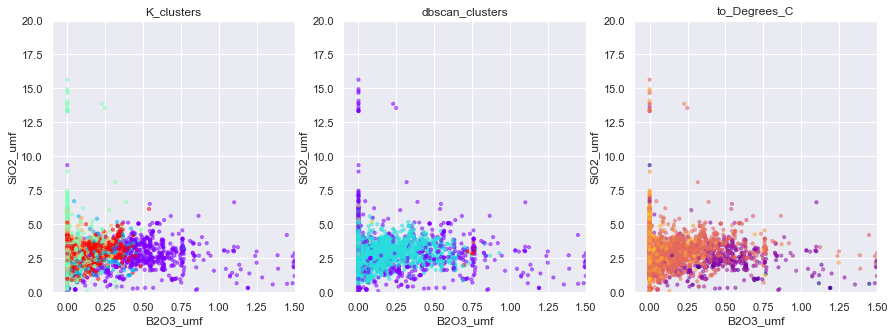

In [2585]:
cluster_list=[ ['K_clusters','rainbow'],
               ['dbscan_clusters','rainbow'],
               ['to_Degrees_C','plasma']]
plt.figure(figsize=(20,5))

for i, cluster in enumerate(cluster_list):
    plt.subplot(1,4,i+1)
    xvar1 = glaze_df['B2O3_umf']
    yvar1 = glaze_df['SiO2_umf']
    hue = glaze_df[cluster[0]]
    color_map = cluster[1]
    plt.scatter(xvar1,yvar1,
            c=hue,
            cmap=color_map,
            s=10, alpha = 0.5)
    plt.ylabel('SiO2_umf')
    plt.xlabel('B2O3_umf')
    plt.title(cluster[0])
    plt.ylim(0,20)
    plt.xlim(-.1,1.5)


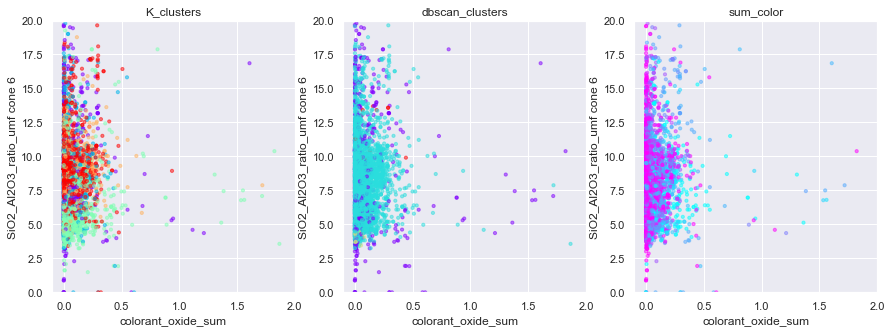

In [2586]:
cluster_list=[['K_clusters','rainbow'],
               ['dbscan_clusters','rainbow'],
               ['sum_color','cool']]
plt.figure(figsize=(20,5))

for i, cluster in enumerate(cluster_list):
    plt.subplot(1,4,i+1)
    xvar1 = glaze_df['colorant_oxide_sum']
    yvar1 = glaze_df['SiO2_Al2O3_ratio_umf']
    hue = glaze_df[cluster[0]]
    color_map = cluster[1]
    plt.scatter(xvar1,yvar1,
            c=hue,
            cmap=color_map,
            s=10, alpha = 0.5)
    plt.ylabel('SiO2_Al2O3_ratio_umf cone 6')
    plt.xlabel('colorant_oxide_sum')
    plt.title(cluster[0])
    plt.ylim(0,20)
    plt.xlim(-.1,2)

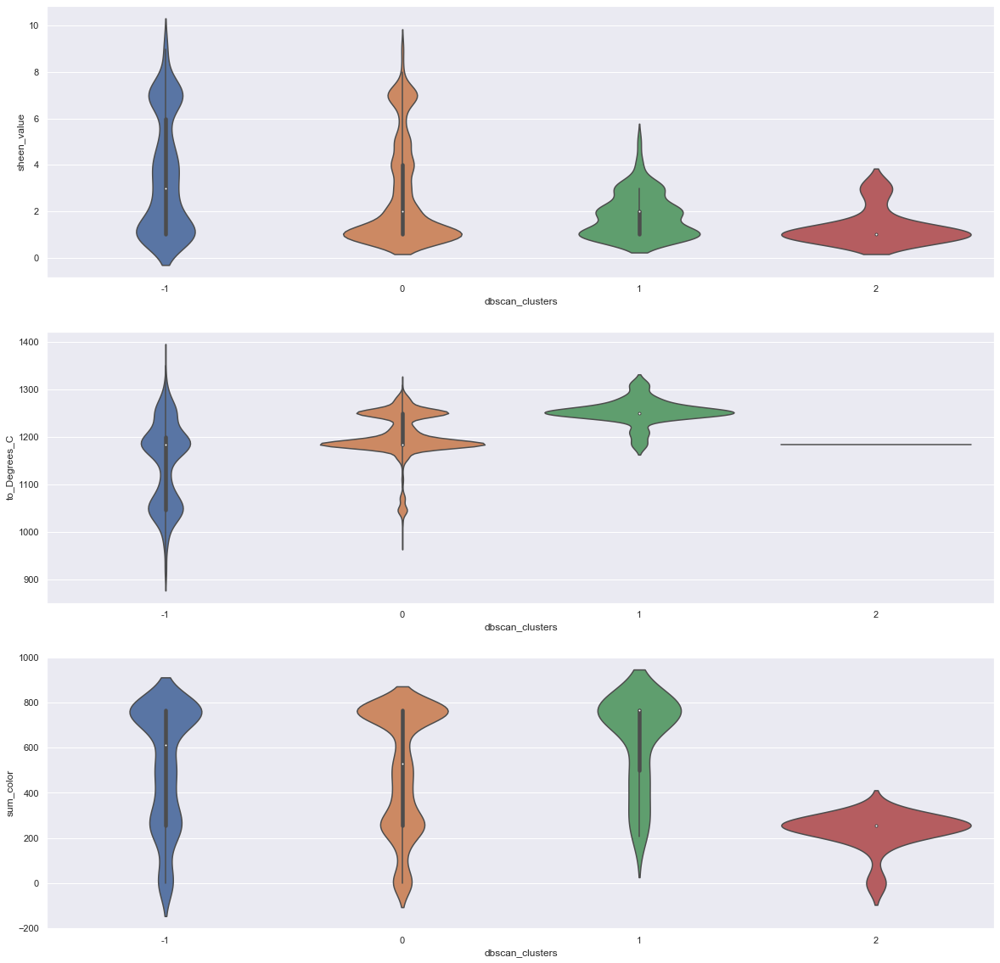

In [2587]:
# explore clusters by temperature and sheen 
plt.figure(figsize=(20,20))
plt.subplot(3,1,1)
sns.violinplot(x="dbscan_clusters", y="sheen_value", data=glaze_df)
plt.subplot(3,1,2)
sns.violinplot(x="dbscan_clusters", y="to_Degrees_C", data=glaze_df)
plt.subplot(3,1,3)
sns.violinplot(x="dbscan_clusters", y="sum_color", data=glaze_df)


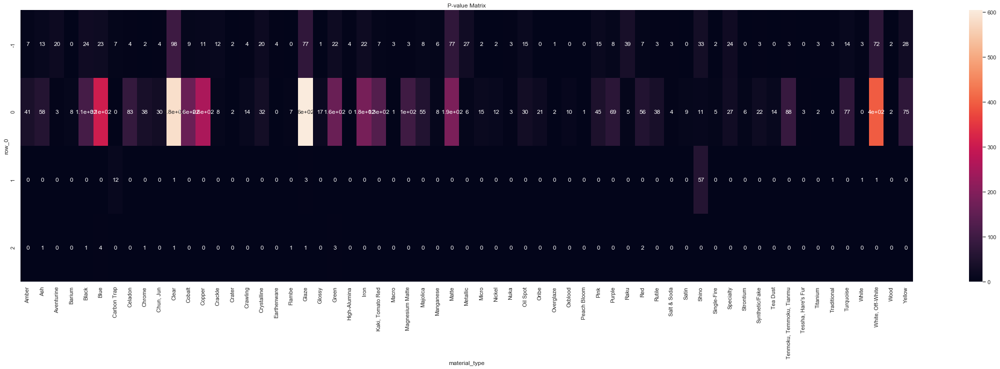

In [2588]:
cross_examin = pd.crosstab(columns = glaze_df.material_type,index =dbscan_clusters)



plt.figure(figsize=(40,10))
sns.set(rc={ 'figure.facecolor':'tab:gray'})

sns.heatmap(cross_examin, annot=True) 
plt.title("P-value Matrix") 
plt.show()

plt.show()

In [2589]:
 glaze_df[['name','material_type',
          'surface_type','to_orton_cone',
          'transparency_type','temp_catagory',
          'is_glossy','dbscan_clusters',
          'RO_umf','R2O_umf', 'B2O3_umf']].loc[dbscan_clusters==0].head()

,name,material_type,surface_type,to_orton_cone,transparency_type,temp_catagory,is_glossy,dbscan_clusters,RO_umf,R2O_umf,B2O3_umf
0,Base Glaze Peltzman,Glaze,Glossy,8,Transparent,Mid,1,0,0.7801,0.2199,0.0000
2,Celadon-type glaze David Pier,Celadon,Glossy,11,Transparent,High,1,0,0.8290,0.1710,0.0000
3,Pier's Pure Lux-Deluxe Revised,Clear,Glossy,9,Transparent,Mid,1,0,0.7751,0.2249,0.1224
4,Blue Acero,Blue,Satin - Matte,11,Semi-opaque,High,0,0,0.7543,0.2457,0.0000
5,#207.3,Clear,Glossy,8,NaN,Mid,1,0,0.7964,0.2036,0.0000


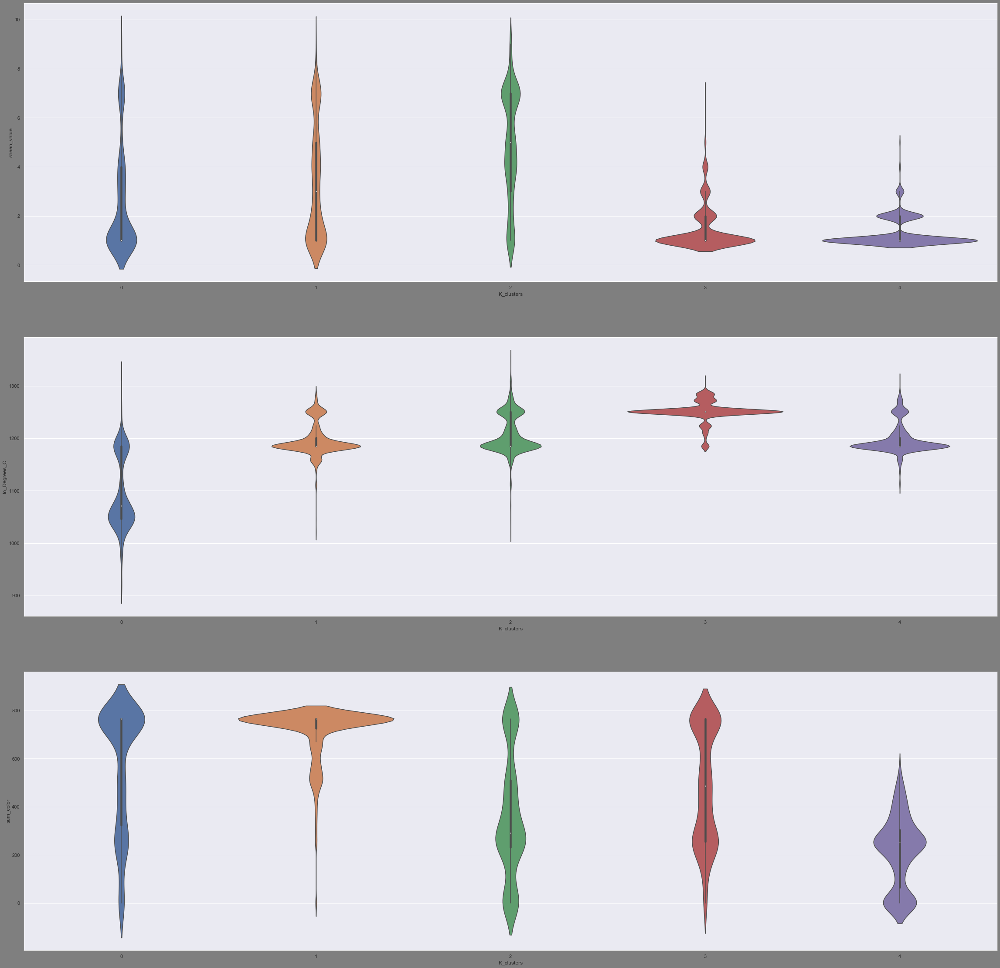

In [2590]:
# explore clusters by temperature and sheen 
plt.figure(figsize=(40,40))
plt.subplot(3,1,1)
sns.violinplot(x="K_clusters", y="sheen_value", data=glaze_df)
plt.subplot(3,1,2)
sns.violinplot(x="K_clusters", y="to_Degrees_C", data=glaze_df)
plt.subplot(3,1,3)
sns.violinplot(x="K_clusters", y="sum_color", data=glaze_df)

plt.show()

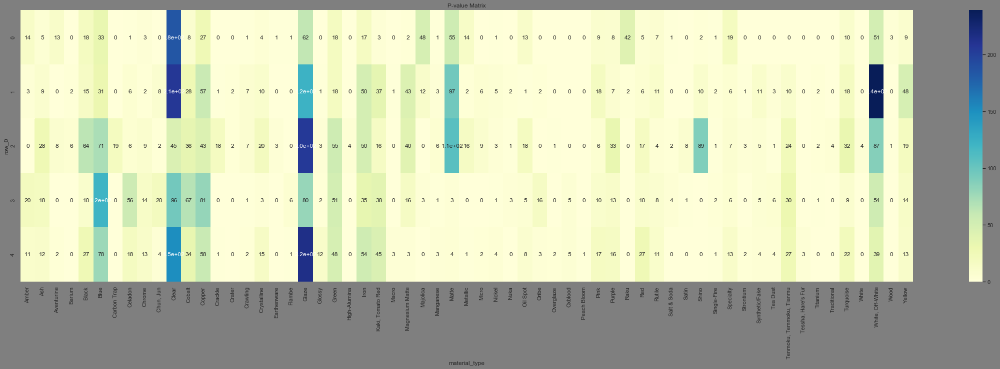

In [2591]:
# compare cluster labels with material type labels
cross_examin = pd.crosstab(columns = glaze_df.material_type,index =K_clusters)

plt.figure(figsize=(40,10))
sns.set(rc={ 'figure.facecolor':'tab:gray'})
sns.heatmap(cross_examin, annot=True, cmap="YlGnBu") 
plt.title("P-value Matrix") 
plt.show()

plt.show()

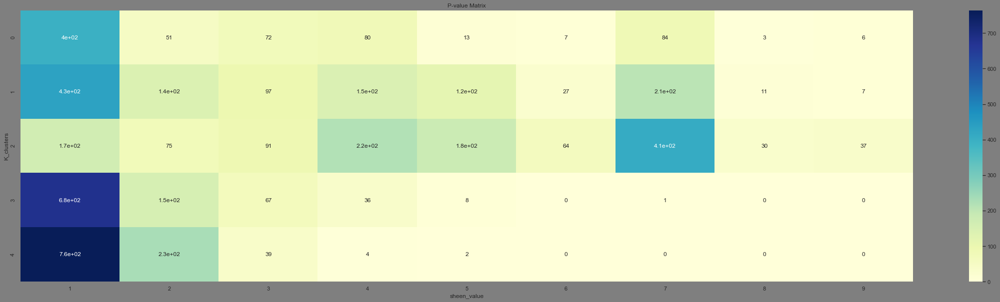

In [2592]:
# compare cluster labels with material type labels
cross_examin = pd.crosstab(columns = glaze_df.sheen_value,index =glaze_df.K_clusters)

plt.figure(figsize=(40,10))
sns.set(rc={ 'figure.facecolor':'tab:gray'})
sns.heatmap(cross_examin, annot=True, cmap="YlGnBu") 
plt.title("P-value Matrix") 
plt.show()

plt.show()

In [2593]:
 glaze_df[['name','material_type',
          'surface_type','to_orton_cone',
          'transparency_type','temp_catagory',
          'is_glossy','dbscan_clusters',
          'K_clusters']].loc[K_clusters==0].tail(40)


,name,material_type,surface_type,to_orton_cone,transparency_type,temp_catagory,is_glossy,dbscan_clusters,K_clusters
6518,"VC/Easy Glossy + Copper Carbonate 1.5, RIO 0.5",Copper,Glossy,6,Transparent,Mid,1,0,0
6519,"VC/Easy Glossy + Copper Carbonate 1, RIO 1",Copper,Glossy,6,Transparent,Mid,1,0,0
6520,"VC/Easy Glossy + Copper Carbonate 0.5, RIO 1.5",Copper,Glossy,6,Transparent,Mid,1,0,0
6521,VC/Easy Glossy + RIO 2,Copper,Glossy,6,Transparent,Mid,1,0,0
6523,Gail Kendall cone 04 clear,Clear,Glossy,04,Transparent,Low,1,-1,0
6545,Blooming Blue,Glaze,Glossy,6,Opaque,Mid,1,0,0
6593,Starry night,Glaze,Glossy,6,NaN,Mid,1,0,0
6598,Floating Blue,Cobalt,Glossy,6,Opaque,Mid,1,0,0
6680,WPG01 Shiny White,"White, Off-White",Glossy,6,Opaque,Mid,1,0,0
6736,"Licorice base + 5 Rio, 1 Titanium Diox.",Amber,Glossy - Semi,6,Semi-opaque,Mid,0,-1,0


In [2594]:
#'material_type' 'to_orton_cone','temp_catagory'''transparency_type'''
glaze_df['to_orton_cone'].loc[K_clusters==2].value_counts()


6     612
10    286
7      84
8      76
9      66
5      51
11     43
12     19
13     11
3       6
03      4
1       4
4       2
2       2
04      2
02      1
05      1
14      1
Name: to_orton_cone, dtype: int64

In [2595]:
glaze_df[['rgb_r','rgb_g',
          'rgb_b','is_glossy','sheen_value',
          'SiO2_Al2O3_ratio_umf',
          'R2O_umf','RO_umf',
          'to_Degrees_C',
          'colorant_oxide_sum',
          'opacity_value', 'B2O3_umf',
          'K_clusters']].loc[K_clusters==2].describe()


,rgb_r,rgb_g,rgb_b,is_glossy,sheen_value,SiO2_Al2O3_ratio_umf,R2O_umf,RO_umf,to_Degrees_C,colorant_oxide_sum,opacity_value,B2O3_umf,K_clusters
count,796.000000,796.000000,796.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,1271.000000,893.000000,1271.000000,1271.0
mean,114.501256,121.419598,118.923367,0.130606,4.867034,6.586665,0.403060,0.596940,1207.551534,0.397616,1.346025,0.045316,2.0
std,100.325314,102.166973,102.923861,0.337101,2.254048,3.117412,0.249437,0.249437,36.780541,4.657758,0.544107,0.077234,0.0
min,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1021.000000,0.000000,1.000000,0.000000,2.0
25%,0.000000,0.000000,3.000000,0.000000,3.000000,4.703200,0.207650,0.460950,1185.000000,0.007300,1.000000,0.000000,2.0
50%,102.000000,117.000000,114.500000,0.000000,5.000000,5.498600,0.328200,0.671800,1185.000000,0.046700,1.000000,0.000000,2.0
75%,219.000000,237.000000,240.250000,0.000000,7.000000,7.864800,0.539050,0.792350,1251.000000,0.120750,2.000000,0.075800,2.0
max,255.000000,255.000000,255.000000,1.000000,9.000000,30.956200,1.000000,1.000000,1351.000000,113.950000,3.000000,0.519000,2.0


# Results 
The variables used in clustering were selected based on their contribution to recipes. The bulk of most glazes are made of silica and alumina. In addition boron, alkali, and alkaline earth oxides are added to enhance melting. Colorant oxides were grouped and summated, along with opacifying oxides. The final firing temperature in degrees C was used as well. All variables were standardized and a UMAP projection was conducted for visualizations and for use with clustering.
The results from clustering suggest utilizing two methods for different purposes: DBSCAN using the standardized variables and Kmeans using the UMAP projections.


In [2599]:
from IPython.display import Image
Image(url= "https://s3.amazonaws.com/glazy.org/public/uploads/recipes/68/l_21968.5b8de516bcb35.jpg")

The above image is a glaze titled 'Tichane Triaxial Celadon (Blue)' in cluster 0 for DBSCAN


#### DBSCAN
   DBSCAN formed 3 weak clusters and a large group of outliers. The algorithm used the Standardized variables and not the UMAP projections and it generated a silhouette score of 0.22, it was quite successful at separating anomalies. The first cluster is populated with typical glazes close to a 0.7 R2O to 0.3 RO flux ratios, and common ratios of silica to alumina. The glazes that clustered in the first group would fall into the realm of durable glazes for functional surfaces such as tile, dinner, and sanitation-ware. The second cluster formed around Shino glazes (also known as carbon trap glazes) a type of Japanese glaze that is high in alkali metal flux and alumina. These glazes are commonly used in wood kilns (kilns where wood is the fuel source). These glazes can be problematic when applied over top of other glazes. The third cluster contained mid-range glazes with alkaline earth oxides RO_umf ranging from 0.80-0.87 and a large amount of boron ~0.7UMF. Many of the glazes in this cluster are recognized for forming what is known as a floating blue effect, these are small smokey blue opacities that form in thicker parts of the glaze resulting in a variegated appearance. Glazes that were separated as outliers fell into the realm of 'effects glazes', these glazes usually fall well outside the chemistry of a typical glaze, and are formulated to create a certain visual effect such as crystals, sparkle, or metallic luster.  These glazes are prone to issues such as metal leaching, crazing, dunting, and shivering, and efflorescence. This makes DBSCAN useful for making suggestions to individuals and companies producing work that has to function and want to create a glaze palette that would not fail their customers.



In [2597]:
from IPython.display import Image
Image(url= "https://s3.amazonaws.com/glazy.org/public/uploads/recipes/25/l_36525.5cca35070fb88.jpg")

Above is an example of a metallic saturate glaze found in the outlier category (-1) from DBSCAN. It is listed as toxic on the website. 

#### Kmeans
 
 
By using K-means on the UMAP projections, 5 clusters were formed with a silhouette score of 0.429.  This was one of the more consistent clustering methods, however, the strength of the clusters is still quite weak. 
0. k cluster0 contains mid-range glazes(Orton cone 4-8) that fire to ~1200C, 
1. K-cluster contains mid-range glazes(Orton cone 4-8) that fire to ~1200C, many of the glazes are dark in color, and a large majority of the glazes are glossy with a small number of semi-gloss glazes. 
2. Low fire glazes with some mid-range(Orton cone 04-8) glazes present, these glazes are highly variable in regards to most other properties  
3. Contains both high fire and mid-range glazes(Orton cone 4-14) that fire to ~1200C and has the largest number of matte glazes for any of the clusters. 
4. Contains primarily high fire glazes most of which are glossy with a high variation in color. 
 
K-means were useful in its ability to create several small weak clusters with the UMAP projections. The K-means clusters were able to separate most glazes by firing temperature range. 
 


### Issues Around Data
Ultimately this dataset was quite difficult to cluster, nearly all clusters formed had silhouette scores below 0.5. This was due to several factors. Several permutations of variables, dimensionality reduction, clustering methods, and hyperparameters were used in an effort to form consistent well-differentiated clusters.
Sparsity was a large problem with this dataset, glazes often employ different metal oxides for the same purpose, for example, a glaze could have a mole to mole substitution of lithium for sodium with little change in color, quality, or physical characteristics. Many of the metal oxides used as colorants for glazes are used in small amounts and can vary widely in how they alter the glaze and the strength of the color. These attributes of metal oxides have led to a large number of zero values for each oxide. The distribution of the data was problematic as well, the dataset had many outliers, this is because most glazes for use on functional surfaces deviate very little from a specific formula, most glazes don't deviate far from a silica to alumina ratio of 7:1 and an RO to R2O flux ratio of 7:2, in addition very few glazes have a high amount of colorant metals in them usually under 10% for added color. This dataset also includes glazes for special effects, these 'effects glazes' often have chemistries that are on the edge of or well outside of the chemical makeup of most glazes. Overlap was also a problem with much of the data. many glazes are only altered by changing one ingredient such as a colorant or metal flux, this results in the overall chemistry of the glaze remaing the same. For example alumina can alter the color and or physical qualities of the glaze quite drastically all the while maintaining the same values for the other variables.


# Conclusions
Ultimately this dataset was quite difficult to cluster, DBSCAN could prove useful to a company producing ceramic objects that want to have a better idea of risk associated with the glaze they are using. K- means could be considered useful for selecting glazes for a someone unfamiliar with glaze chemistry,  however, it wouldn't provide any more information than someone with experience in ceramics wouldn’t already know.  
 
## Further Experimentation
Several avenues of further experimentation and data collection became apparent when working with this dataset.
 
In regards to data collection, the currently available color data really only helps in differentiating dark and light glazes. There also isn’t any information on how the color data was collected. Glazes tend to show a high level of subtle variation in color, something that this dataset clearly doesn't capture.  One way to do this would be to take images of example glaze tiles found on the web site and sample them for color variation.  This would likely require a neural network to define the boundaries of the tile in the image, along with a way to correct variation from lighting methods, white balance, and camera types. 
 
To further improve clusters, it might be possible to use some sort of ensemble method for clustering glazes, a method where DBSCAN outliers are clustered separately of glazes that fall inside the dense clusters of the dataset. This might be able to improve clustering since the distances wouldn’t vary as much. 
The high overlap, wide variance, and high dimensionality of the dataset suggests it might be better for some sort of regression analysis to predict qualities. 
A regression analysis of melting temperature, color, opacity, and surface could be a useful tool for someone trying to select traits of a glaze or for someone who is trying to substitute materials. This would likely require information about the raw ingredients used.  
 
 
